# <div class="alert alert-block alert-info"><font color='black'><center>Problem Statement</font></div>
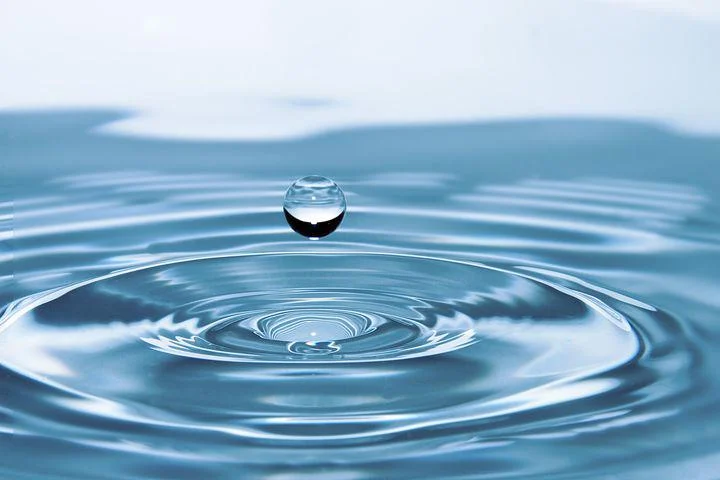

![Water Access Global Map](https://www.isglobal.org/documents/10179/6939455/sdg+6+grande+en/2ce9861b-4bdd-4e19-9f59-750d52acc3c3?t=1539683454000)

### <div class="alert alert-block alert-warning"><font color='black'><center>1 in 3 worldwide do not have access to safe drinking water<br><br>More than 80% of wastewater resulting from human activities is discharged into rivers and seas without any pollution removal</font></div>

![Water Access Global Map](https://ourworldindata.org/exports/share-without-improved-water_v6_850x600.svg)

### <div class="alert alert-block alert-info"><font color='black'><center>Helping water companies especially in developing countries to determine whether a water source is safe to drink without treatment, and if not which variables to acknowledge first?</font></div>

# <div class="alert alert-block alert-info"><font color='black'><center>Variables</font></div>

---

>1. __ph:__ pH of 1. water (0 to 14).
>
>
>2. __Hardness:__ Capacity of water to precipitate soap in mg/L.
>
>
>3. __Solids:__ Total dissolved solids in ppm.
>
>
>4. __Chloramines:__ Amount of Chloramines in ppm.
>
>
>5. __Sulfate:__ Amount of Sulfates dissolved in mg/L.
>
>
>6. __Conductivity:__ Electrical conductivity of water in μS/cm.
>
>
>7. __Organic_carbon:__ Amount of organic carbon in ppm.
>
>
>8. __Trihalomethanes:__ Amount of Trihalomethanes in μg/L.
>
>
>9. __Turbidity:__ Measure of light emiting property of water in Nephelometric Turbidity Units (NTU).
>
>
>10. __Potability:__ Indicates if water is safe for human consumption. Potable - 1 and Not potable - 0

In [1]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
sb.set() # set the default Seaborn style for graphics

In [2]:
# Saving the database in a pd dataframe
waterdata = pd.read_csv('water_potability.csv')
waterdata.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [3]:
# Information about the variables
waterdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [4]:
# Extract only the numeric data variables
numeric_data = pd.DataFrame(waterdata[["ph", "Hardness", "Solids", "Chloramines", "Sulfate", "Conductivity","Organic_carbon", "Trihalomethanes", "Turbidity"]])

# Summary Statistics for all Variables
numeric_data.describe().round(2)

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
count,2785.00,3276.00,3276.00,3276.00,2495.00,3276.00,3276.00,3114.00,3276.00
mean,7.08,196.37,22014.09,7.12,333.78,426.21,14.28,66.40,3.97
std,1.59,32.88,8768.57,1.58,41.42,80.82,3.31,16.18,0.78
min,0.00,47.43,320.94,0.35,129.00,181.48,2.20,0.74,1.45
25%,6.09,176.85,15666.69,6.13,307.70,365.73,12.07,55.84,3.44
50%,7.04,196.97,20927.83,7.13,333.07,421.88,14.22,66.62,3.96
75%,8.06,216.67,27332.76,8.11,359.95,481.79,16.56,77.34,4.50
max,14.00,323.12,61227.20,13.13,481.03,753.34,28.30,124.00,6.74


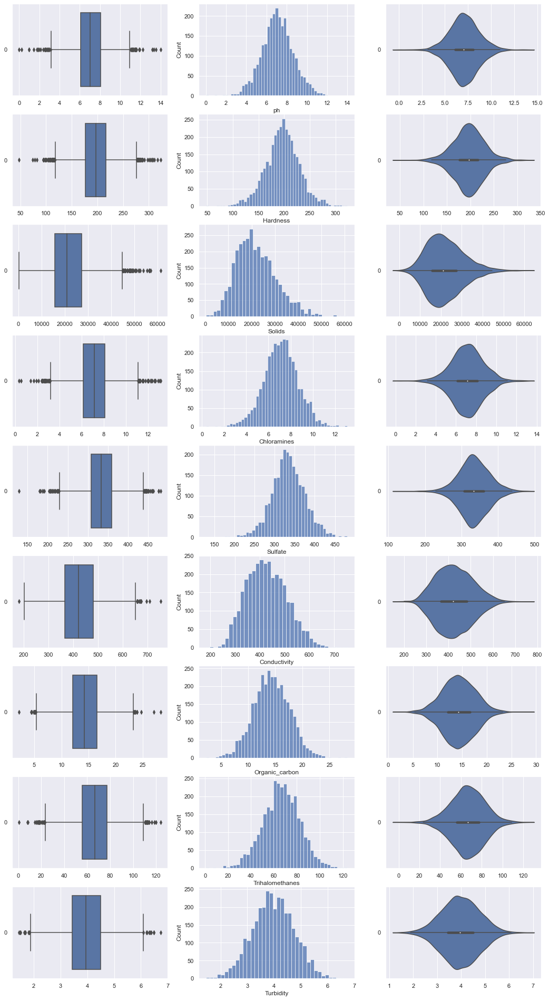

In [5]:
# Draw the distributions of all variables
f, axes = plt.subplots(9, 3, figsize=(18, 34))

count = 0
for var in numeric_data:
    sb.boxplot(data = numeric_data[var], orient = "h", ax = axes[count,0])
    sb.histplot(data = numeric_data[var], ax = axes[count,1])
    sb.violinplot(data = numeric_data[var], orient = "h", ax = axes[count,2])
    count += 1

# <div class="alert alert-block alert-info"><font color='black'><center>Data Preparation</font></div>


In [6]:
# Checking the number of null cells in each variable
waterdata.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

#### Extracted Data When Potability = 0

In [7]:
# All the data when Potability = 0
waterdata[waterdata['Potability'] == 0].describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,1684.000000,1998.000000,1998.000000,1998.000000,1510.000000,1998.000000,1998.000000,1891.000000,1998.000000,1998.0
mean,7.085378,196.733292,21777.490788,7.092175,334.564290,426.730454,14.364335,66.303555,3.965800,0.0
std,1.683499,31.057540,8543.068788,1.501045,36.745549,80.047317,3.334554,16.079320,0.780282,0.0
min,0.000000,98.452931,320.942611,1.683993,203.444521,181.483754,4.371899,0.738000,1.450000,0.0
25%,6.037723,177.823265,15663.057382,6.155640,311.264006,368.498530,12.101057,55.706530,3.444062,0.0
50%,7.035456,197.123423,20809.618280,7.090334,333.389426,422.229331,14.293508,66.542198,3.948076,0.0
75%,8.155510,216.120687,27006.249009,8.066462,356.853897,480.677198,16.649485,77.277704,4.496106,0.0
max,14.000000,304.235912,61227.196008,12.653362,460.107069,753.342620,28.300000,120.030077,6.739000,0.0


##### Median

In [8]:
# Median of variables when Potability = 0
waterdata[waterdata['Potability'] == 0][['ph','Sulfate','Trihalomethanes']].median()

ph                   7.035456
Sulfate            333.389426
Trihalomethanes     66.542198
dtype: float64

##### Mean

In [9]:
# Mean of variables when Potability = 0
waterdata[waterdata['Potability'] == 0][['ph','Sulfate','Trihalomethanes']].mean()

ph                   7.085378
Sulfate            334.564290
Trihalomethanes     66.303555
dtype: float64

#### Extracted Data When Potability = 1

In [10]:
# All the data when Potability = 0
waterdata[waterdata['Potability'] == 1].describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,1101.000000,1278.000000,1278.000000,1278.000000,985.000000,1278.000000,1278.000000,1223.000000,1278.000000,1278.0
mean,7.073783,195.800744,22383.991018,7.169338,332.566990,425.383800,14.160893,66.539684,3.968328,1.0
std,1.448048,35.547041,9101.010208,1.702988,47.692818,82.048446,3.263907,16.327419,0.780842,0.0
min,0.227499,47.432000,728.750830,0.352000,129.000000,201.619737,2.200000,8.175876,1.492207,1.0
25%,6.179312,174.330531,15668.985035,6.094134,300.763772,360.939023,12.033897,56.014249,3.430909,1.0
50%,7.036752,196.632907,21199.386614,7.215163,331.838167,420.712729,14.162809,66.678214,3.958576,1.0
75%,7.933068,218.003420,27973.236446,8.199261,365.941346,484.155911,16.356245,77.380975,4.509569,1.0
max,13.175402,323.124000,56488.672413,13.127000,481.030642,695.369528,23.604298,124.000000,6.494249,1.0


##### Median

In [11]:
# Median of variables when Potability = 1
waterdata[waterdata['Potability'] == 1][['ph','Sulfate','Trihalomethanes']].median()

ph                   7.036752
Sulfate            331.838167
Trihalomethanes     66.678214
dtype: float64

##### Mean

In [12]:
# Mean of variables when Potability = 1
waterdata[waterdata['Potability'] == 1][['ph','Sulfate','Trihalomethanes']].mean()

ph                   7.073783
Sulfate            332.566990
Trihalomethanes     66.539684
dtype: float64

The difference between mean and median values of Potable and Non-Potable Water is very minimal. <br>
Therefore we can use both mean or median to subsitute the missing data. <br>
Mean of the feature has been chosen to be added into the missing values.

In [13]:
waterdata['ph'].fillna(value=waterdata['ph'].mean(),inplace=True)
waterdata['Sulfate'].fillna(value=waterdata['Sulfate'].mean(),inplace=True)
waterdata['Trihalomethanes'].fillna(value=waterdata['Trihalomethanes'].mean(),inplace=True)

In [14]:
waterdata.isnull().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

In [15]:
# Converting binary numbers into boolean for Potability
waterdata.iloc[:, -1] = waterdata.iloc[:, -1].astype(bool)
waterdata.head(-20)

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,7.080795,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,False
1,3.716080,129.422921,18630.057858,6.635246,333.775777,592.885359,15.180013,56.329076,4.500656,False
2,8.099124,224.236259,19909.541732,9.275884,333.775777,418.606213,16.868637,66.420093,3.055934,False
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,False
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,False
...,...,...,...,...,...,...,...,...,...,...
3251,4.825591,234.783904,11142.392632,6.442769,370.416831,370.188948,13.046355,46.315992,3.463097,True
3252,4.868827,258.678959,13400.385532,4.880910,333.775777,328.764529,17.352080,55.968217,3.255600,True
3253,7.395451,190.477892,22561.508311,8.310195,294.030395,413.910293,13.301374,63.410178,4.990236,True
3254,8.862113,131.635177,17433.601853,7.639573,340.133165,399.462844,16.712206,53.594104,4.955082,True


In [16]:
waterdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               3276 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          3276 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3276 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   bool   
dtypes: bool(1), float64(9)
memory usage: 233.7 KB


# <div class="alert alert-block alert-info"><font color='black'><center>Anomaly Detection</font></div>

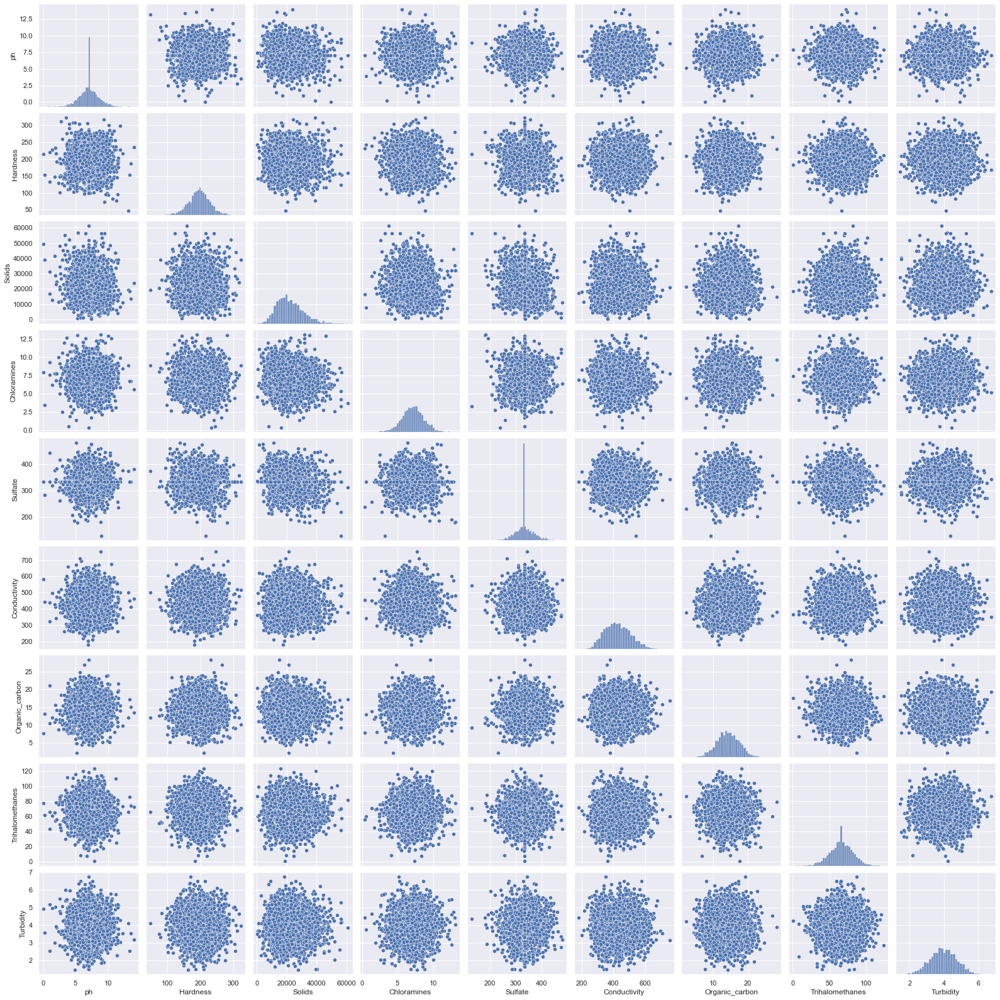

In [17]:
# Extract the all variables from the Data
waterdata_anomaly = pd.DataFrame(waterdata[["ph", "Hardness", "Solids", "Chloramines", "Sulfate", "Conductivity","Organic_carbon", "Trihalomethanes", "Turbidity", ]])

# Plot the Raw Data on 2D grids
sb.pairplot(waterdata_anomaly)

In [18]:
# Import LocalOutlierFactor from sklearn.neighbors
from sklearn.neighbors import LocalOutlierFactor

# Set the Parameters for Neighborhood
num_neighbors = 20      # Number of Neighbors
cont_fraction = 0.05    # Fraction of Anomalies

# Create Anomaly Detection Model using LocalOutlierFactor
lof = LocalOutlierFactor(n_neighbors = num_neighbors, contamination = cont_fraction)

# Fit the Model on the Data and Predict Anomalies
lof.fit(waterdata_anomaly)

LocalOutlierFactor(contamination=0.05)

<AxesSubplot:xlabel='Anomaly', ylabel='count'>

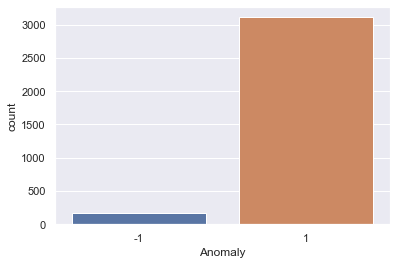

In [19]:
# Predict the Anomalies
labels = lof.fit_predict(waterdata_anomaly)

# Append Labels to the Data
waterdata_anomaly_labeled = waterdata_anomaly.copy()
waterdata_anomaly_labeled["Anomaly"] = pd.Categorical(labels)

# Summary of the Anomaly Labels
sb.countplot(x=waterdata_anomaly_labeled["Anomaly"])

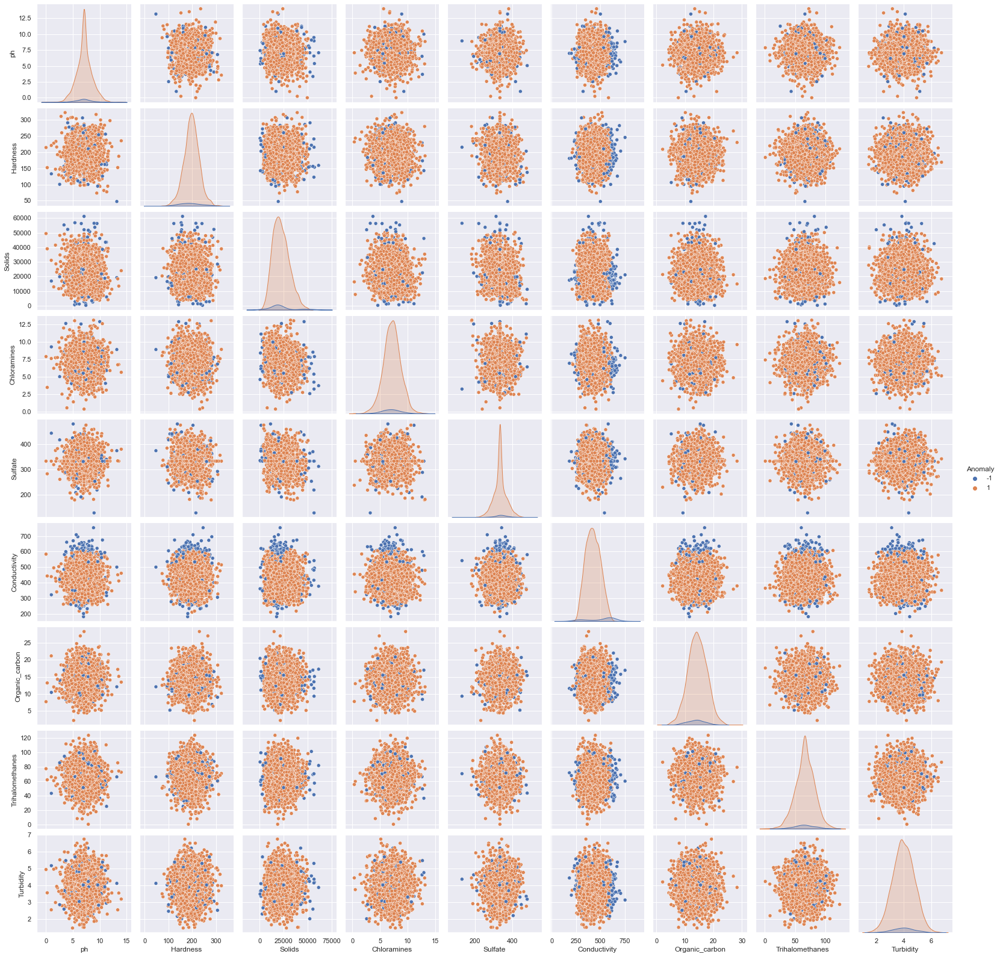

In [20]:
# Visualize the Anomalies in the Data
sb.pairplot(waterdata_anomaly_labeled, vars = waterdata_anomaly.columns.values, hue = "Anomaly")

<AxesSubplot:xlabel='Turbidity', ylabel='Anomaly'>

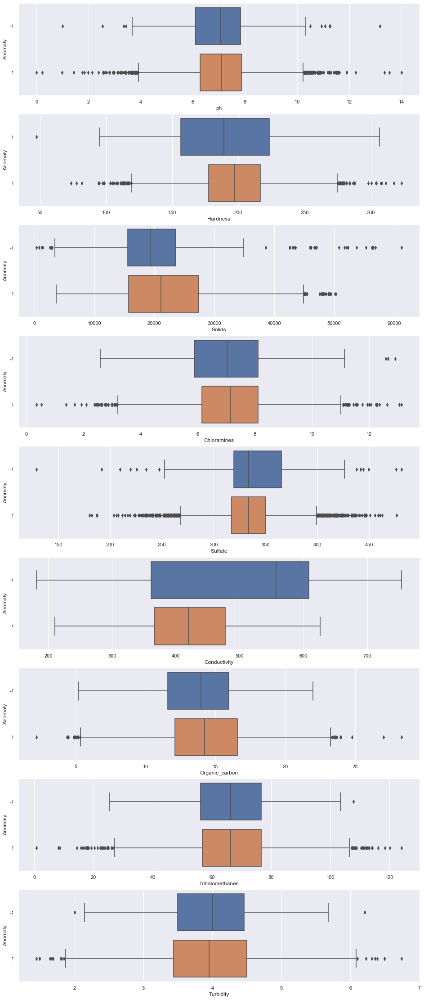

In [21]:
# Plot boxplots for all Features against the Anomalies
f, axes = plt.subplots(9, 1, figsize=(16,40))
sb.boxplot(x = 'ph', y = 'Anomaly', data = waterdata_anomaly_labeled, ax = axes[0])
sb.boxplot(x = 'Hardness', y = 'Anomaly', data = waterdata_anomaly_labeled, ax = axes[1])
sb.boxplot(x = 'Solids', y = 'Anomaly', data = waterdata_anomaly_labeled, ax = axes[2])
sb.boxplot(x = 'Chloramines', y = 'Anomaly', data = waterdata_anomaly_labeled, ax = axes[3])
sb.boxplot(x = 'Sulfate', y = 'Anomaly', data = waterdata_anomaly_labeled, ax = axes[4])
sb.boxplot(x = 'Conductivity', y = 'Anomaly', data = waterdata_anomaly_labeled, ax = axes[5])
sb.boxplot(x = 'Organic_carbon', y = 'Anomaly', data = waterdata_anomaly_labeled, ax = axes[6])
sb.boxplot(x = 'Trihalomethanes', y = 'Anomaly', data = waterdata_anomaly_labeled, ax = axes[7])
sb.boxplot(x = 'Turbidity', y = 'Anomaly', data = waterdata_anomaly_labeled, ax = axes[8])

The anomalies detected consist of points that lie close to the 'normal' data determined by the model. <br>
Furthermore, the model might have errors in determining the anomalies as the points are very close to each other with little or no significant difference. <br>
Therefore, the anomalies detected is neglected since it would not change the results much.<br>
The lack in anomaly means that there are no particular water sources with very extreme features.<br>

# <div class="alert alert-block alert-info"><font color='black'><center>Correlation between variables</font></div>

In [22]:
# Correlation Matrix
cor=waterdata.drop('Potability',axis=1).corr()
cor

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
ph,1.000000,0.075833,-0.081884,-0.031811,0.014403,0.017192,0.040061,0.002994,-0.036222
Hardness,0.075833,1.000000,-0.046899,-0.030054,-0.092766,-0.023915,0.003610,-0.012690,-0.014449
Solids,-0.081884,-0.046899,1.000000,-0.070148,-0.149840,0.013831,0.010242,-0.008875,0.019546
Chloramines,-0.031811,-0.030054,-0.070148,1.000000,0.023791,-0.020486,-0.012653,0.016627,0.002363
Sulfate,0.014403,-0.092766,-0.149840,0.023791,1.000000,-0.014059,0.026909,-0.025605,-0.009790
Conductivity,0.017192,-0.023915,0.013831,-0.020486,-0.014059,1.000000,0.020966,0.001255,0.005798
Organic_carbon,0.040061,0.003610,0.010242,-0.012653,0.026909,0.020966,1.000000,-0.012976,-0.027308
Trihalomethanes,0.002994,-0.012690,-0.008875,0.016627,-0.025605,0.001255,-0.012976,1.000000,-0.021502
Turbidity,-0.036222,-0.014449,0.019546,0.002363,-0.009790,0.005798,-0.027308,-0.021502,1.000000


<AxesSubplot:>

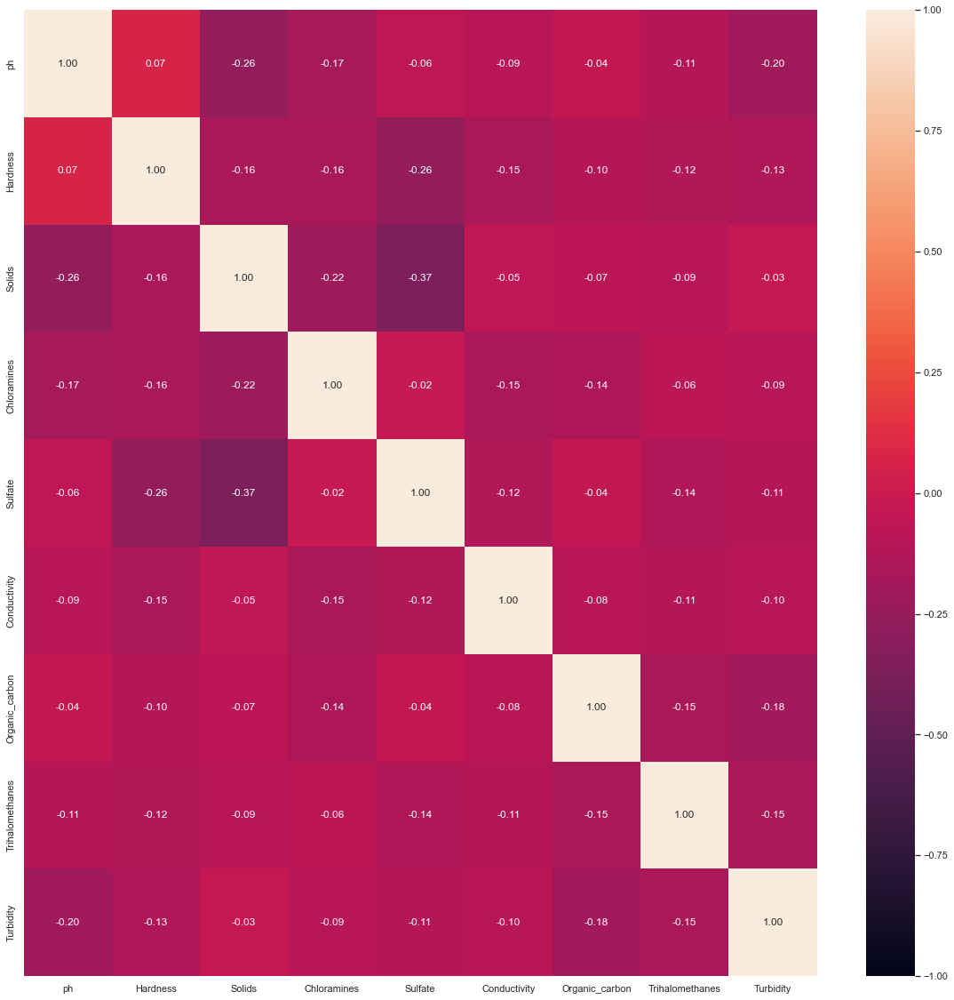

In [23]:
# Heatmap of the Correlation Matrix
f = plt.figure(figsize=(20, 20))
sb.heatmap(cor.corr(), vmin = -1, vmax = 1, annot = True, fmt=".2f")

The correlation between each variables are very low (nearly 0).<br>
All of them having a low negative correlation, except for ph and Hardness, having a low positive correlation.<br>
A low correlation means that the variables are independent to each other and therefore, we have to use all our variables in our analysis. 

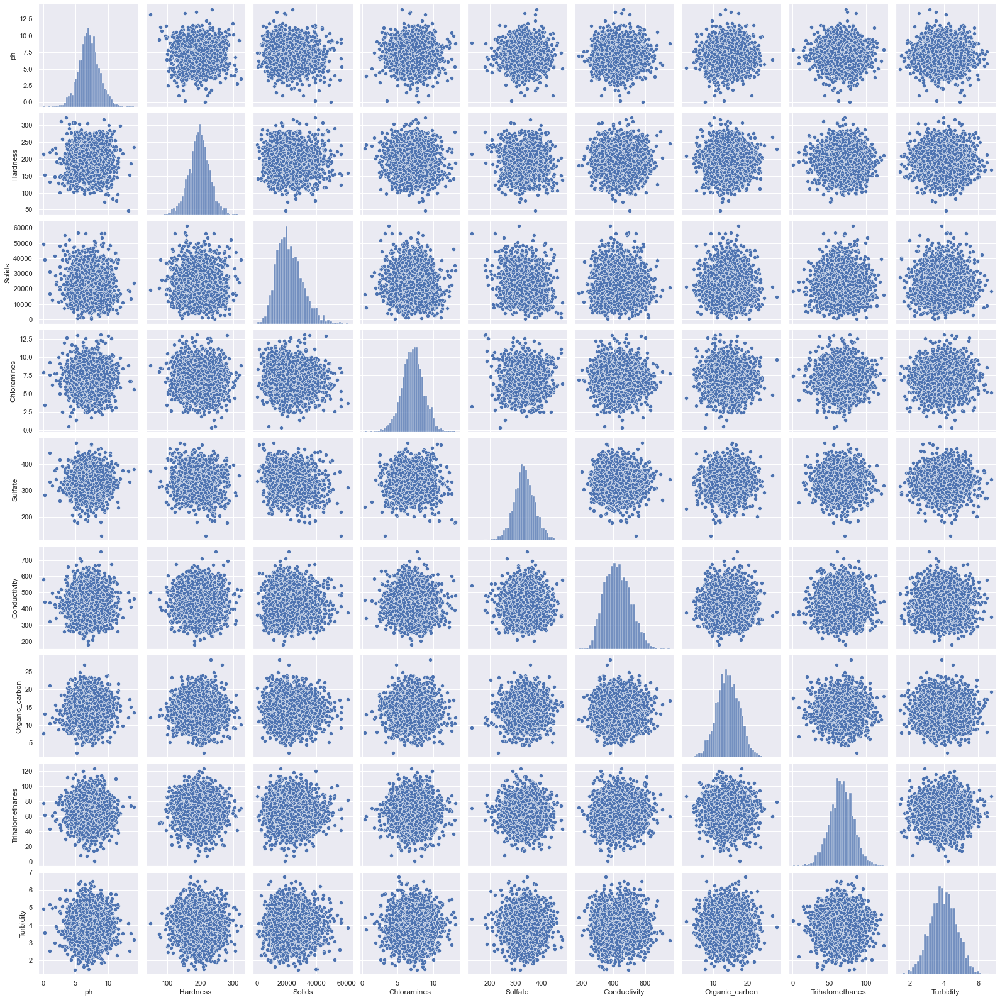

In [24]:
# Plot pairplots of variables against one another
sb.pairplot(data = numeric_data)

In [25]:
print("Data type : ", type(waterdata))
print("Data dims : ", waterdata.shape)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (3276, 10)


In [26]:
waterdata['Potability'].value_counts(dropna=False)

False    1998
True     1278
Name: Potability, dtype: int64

# <div class="alert alert-block alert-info"><font color='black'><center>Classification Tree</font></div>

#### Preparing and stratifying the predictor: potability.
 In this way, both the training and test datasets will have similar portions of the target classes as the complete dataset.

In [27]:
potability = pd.DataFrame(waterdata['Potability'])

In [28]:
# Import train_test_split from sklearn
from sklearn.model_selection import train_test_split

# Split the Dataset into Train and Test
random_seed=888
potability_train, potability_test = train_test_split(potability, test_size = 0.25, random_state=random_seed, stratify=potability)

We stratify the data so that we have the same ratio of false and true from potability in train and test data to make fair for comparison of model.

In [29]:
# Ratio of False and True for potability in test and train data
print(potability_train.shape)
print(potability_test.shape)
print()
print(potability_train.value_counts(normalize=True))
print()
print(potability_test.value_counts(normalize=True))

(2457, 1)
(819, 1)

Potability
False         0.610094
True          0.389906
dtype: float64

Potability
False         0.60928
True          0.39072
dtype: float64


In [30]:
waterdata['Potability'].describe()

count      3276
unique        2
top       False
freq       1998
Name: Potability, dtype: object

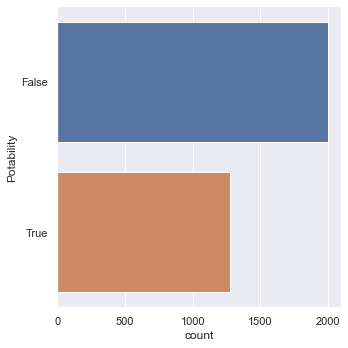

In [31]:
# Plot catplot for potability 
sb.catplot(y = 'Potability', data = waterdata, kind = "count")

## <div class="alert alert-block alert-warning"><font color='black'><center>ph and Potability</font></div>

Plot `Potability` against `ph` to visualize their mutual relationship.

In [32]:
# Extract potability and ph individually from the Data
potability = pd.DataFrame(waterdata['Potability'])  # Response
ph = pd.DataFrame(waterdata['ph'])                  # Predictor

<AxesSubplot:>

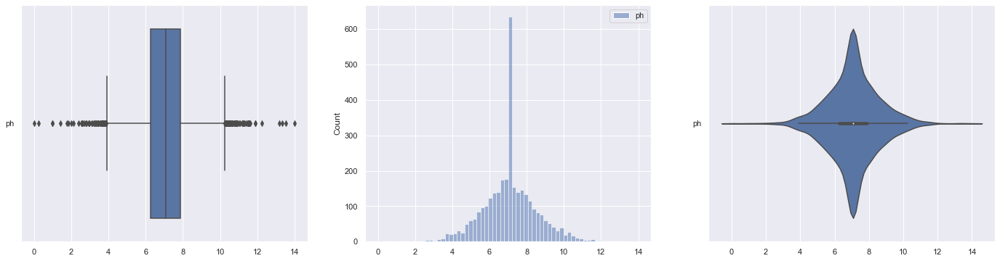

In [33]:
# Plot the distributions of ph
f, axes = plt.subplots(1, 3, figsize=(24, 6))
sb.boxplot(data = ph, orient = "h", ax = axes[0])
sb.histplot(data = ph, ax = axes[1])
sb.violinplot(data = ph, orient = "h", ax = axes[2])

<AxesSubplot:xlabel='ph', ylabel='Potability'>

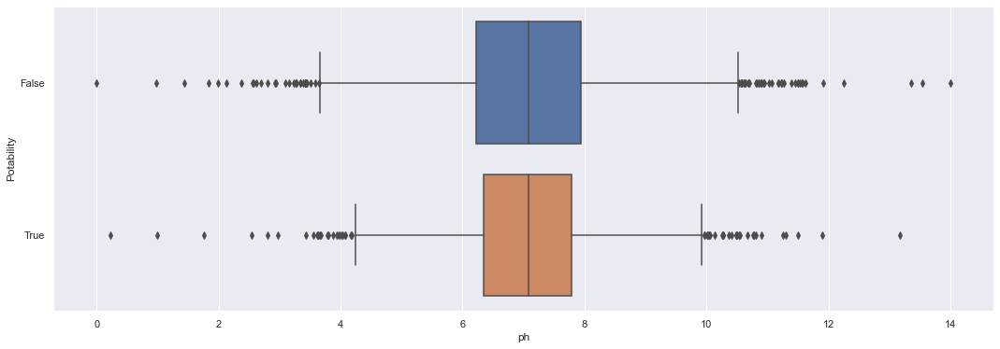

In [34]:
# Create a joint dataframe by concatenating ph and Potability
ph_Potability = pd.concat([ph, potability], axis = 1).reindex(ph.index)

# Plot Joint Boxplot of ph against potability
f = plt.figure(figsize=(18, 6))
sb.boxplot(x = "ph", y = "Potability", data = ph_Potability, orient="h")

C:\Users\youxi\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 14.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\youxi\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 12.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


<AxesSubplot:xlabel='ph', ylabel='Potability'>

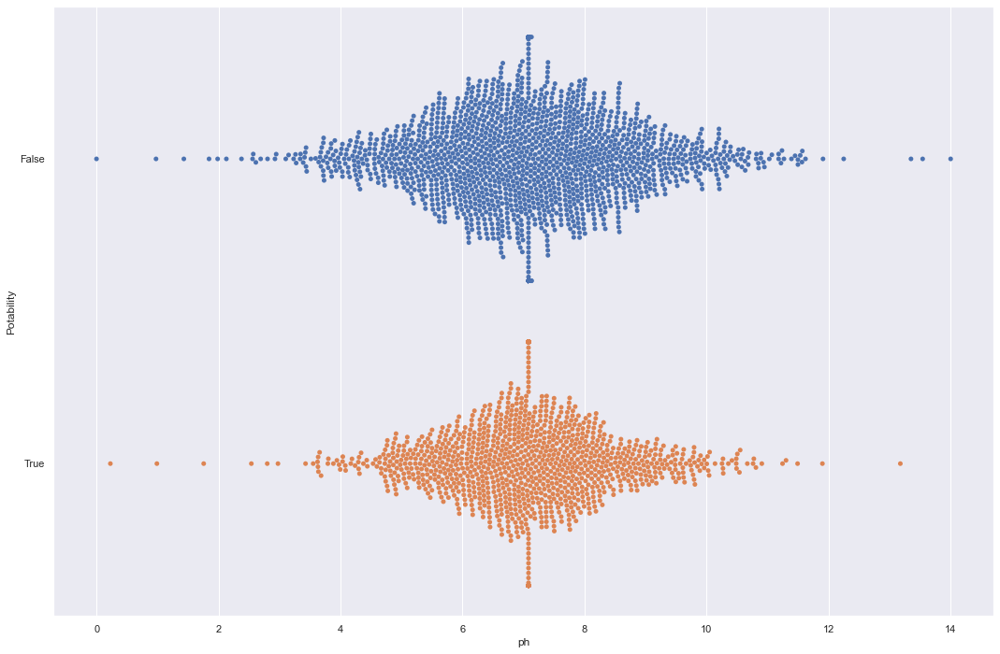

In [35]:
# Plot Joint Swarmplot of ph against Potability
f = plt.figure(figsize=(18, 12))
sb.swarmplot(x = "ph", y = "Potability", data = ph_Potability, orient = "h")

In [36]:
# Summary Statistics for Potability Train
potability_train.value_counts()

Potability
False         1499
True           958
dtype: int64

In [37]:
# Split the Dataset into Train and Test
ph_train, ph_test = train_test_split(ph, test_size = 0.25, random_state=random_seed)

In [38]:
# Summary Statistics for ph Train
ph_train.describe()

,ph
count,2457.000000
mean,7.096702
std,1.490540
min,0.000000
25%,6.280905
50%,7.080795
75%,7.893313
max,14.000000


In [39]:
type(potability_train["Potability"])

pandas.core.series.Series

In [40]:
# Import Decision Tree Classifier model from Scikit-Learn
from sklearn.tree import DecisionTreeClassifier

# Create a Decision Tree Classifier object
dectree_ph = DecisionTreeClassifier(max_depth = 3)

In [41]:
# Train the Decision Tree Classifier model
dectree_ph.fit(ph_train, potability_train)

DecisionTreeClassifier(max_depth=3)

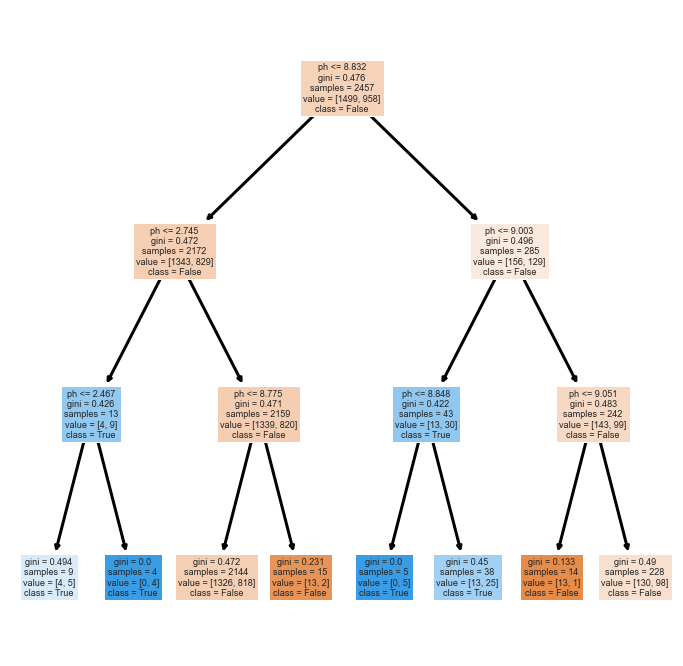

In [42]:
# Plot decision tree for ph to determine potability
from sklearn.tree import plot_tree
fig, ax = plt.subplots(figsize=(12, 12))
out = plot_tree(dectree_ph, 
          feature_names = ph_train.columns,
          class_names = [str(x) for x in dectree_ph.classes_],
          filled=True)

for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(3)
        
plt.show()

Classification Accuracy 	: 0.6190476190476191


<AxesSubplot:>

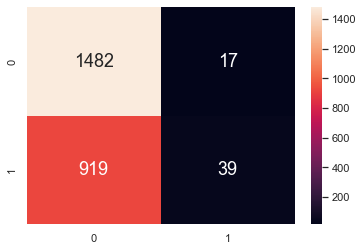

In [43]:
# Predict Potability corresponding to ph Train
potability_train_pred = dectree_ph.predict(ph_train)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree_ph.score(ph_train, potability_train))

# Plot the two-way Confusion Matrix
from sklearn.metrics import confusion_matrix
sb.heatmap(confusion_matrix(potability_train, potability_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

Classification Accuracy 	: 0.6007326007326007


<AxesSubplot:>

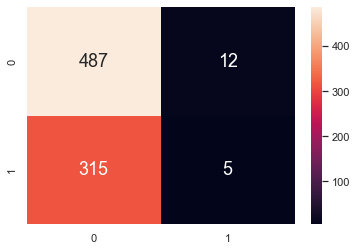

In [44]:
# Predict Potability corresponding to ph Test
potability_test_pred = dectree_ph.predict(ph_test)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree_ph.score(ph_test, potability_test))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(potability_test, potability_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

## <div class="alert alert-block alert-warning"><font color='black'><center>Hardness and Potability</font></div>

Plot `Potability` against `Hardness` to visualize their mutual relationship.

In [45]:
# Response: Potability
# Extract Hardness from the Data
hardness = pd.DataFrame(waterdata['Hardness'])      # Predictor

<AxesSubplot:>

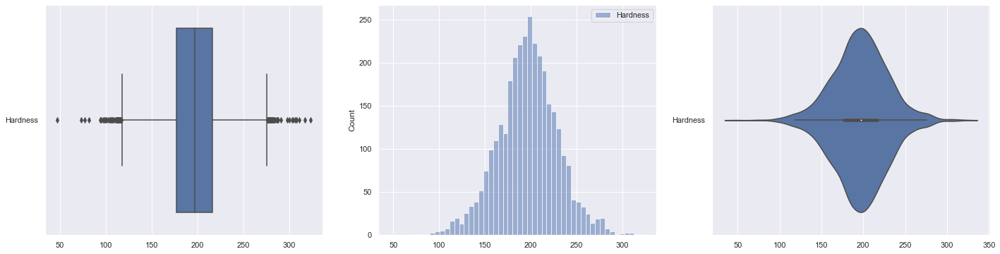

In [46]:
# Plot the distributions of Hardness
f, axes = plt.subplots(1, 3, figsize=(24, 6))
sb.boxplot(data = hardness, orient = "h", ax = axes[0])
sb.histplot(data = hardness, ax = axes[1])
sb.violinplot(data = hardness, orient = "h", ax = axes[2])

<AxesSubplot:xlabel='Hardness', ylabel='Potability'>

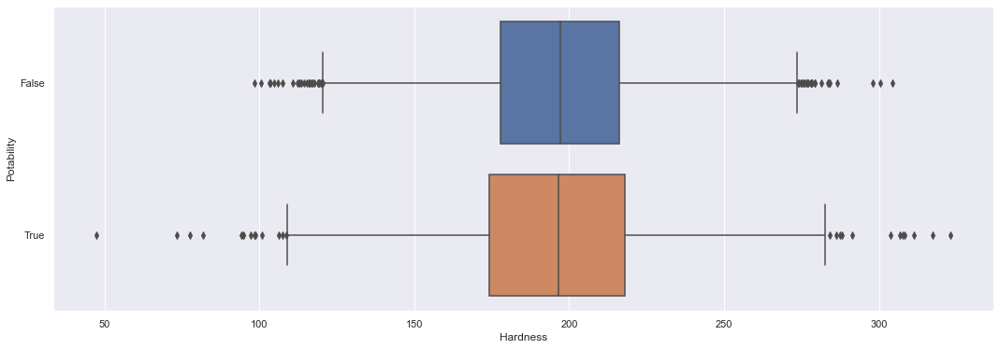

In [47]:
# Create a joint dataframe by concatenating Hardness and Potability
Hardness_Potability = pd.concat([hardness, potability], axis = 1).reindex(hardness.index)

# Plot Joint Boxplot of Hardness against Potability
f = plt.figure(figsize=(18, 6))
sb.boxplot(x = "Hardness", y = "Potability", data = Hardness_Potability, orient="h")

<AxesSubplot:xlabel='Hardness', ylabel='Potability'>

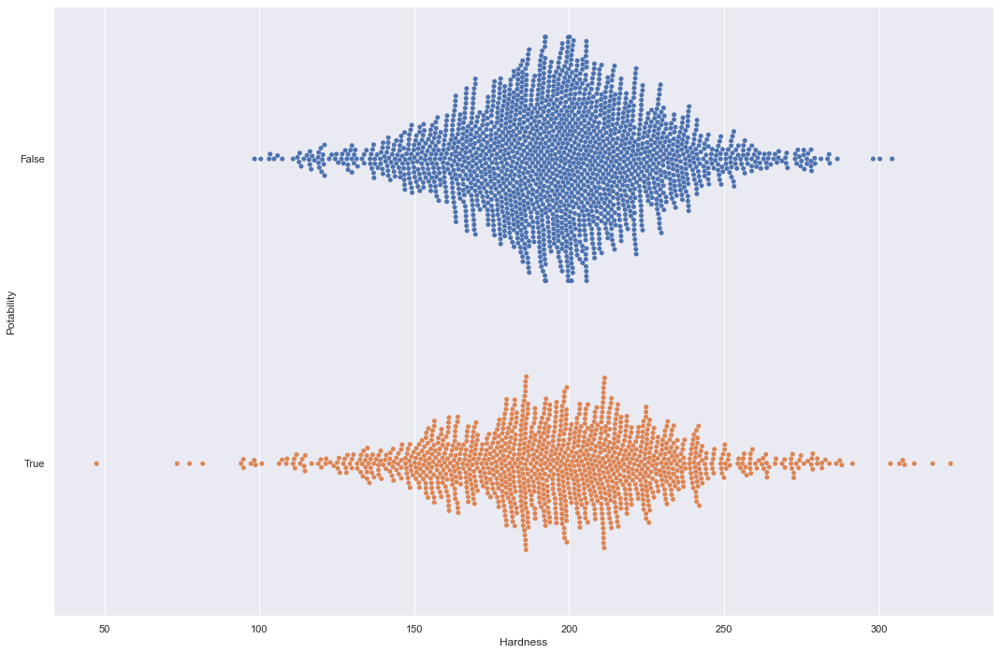

In [48]:
# Plot Joint Swarmplot of Hardness against Potability
f = plt.figure(figsize=(18, 12))
sb.swarmplot(x = "Hardness", y = "Potability", data = Hardness_Potability, orient = "h")

In [49]:
# Split the Potability-Hardness Dataset into Train and Test
hardness_train, hardness_test = train_test_split(hardness, test_size = 0.25, random_state = random_seed)

In [50]:
# Summary Statistics for Hardness Train
hardness_train.describe()

,Hardness
count,2457.000000
mean,196.715513
std,32.985373
min,47.432000
25%,176.640063
50%,197.191839
75%,217.368014
max,323.124000


In [51]:
# Create a Decision Tree Classifier object
dectree_hardness = DecisionTreeClassifier(max_depth = 3)

In [52]:
# Train the Decision Tree Classifier model
dectree_hardness.fit(hardness_train, potability_train)

DecisionTreeClassifier(max_depth=3)

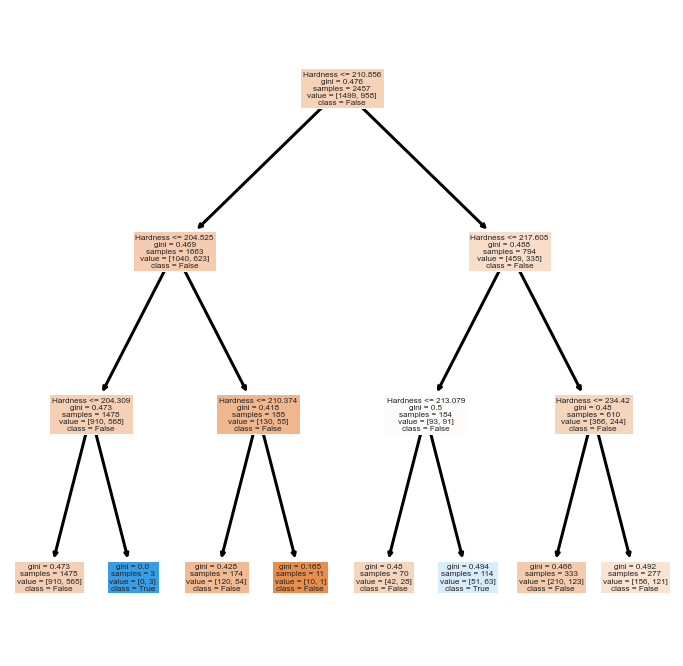

In [53]:
# Plot decision tree for hardness to determine its potability
fig, ax = plt.subplots(figsize=(12, 12))
out = plot_tree(dectree_hardness, 
          feature_names = hardness_train.columns,
          class_names = [str(x) for x in dectree_hardness.classes_],
          filled=True)

for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(3)
        
plt.show()

Classification Accuracy 	: 0.6161986161986162


<AxesSubplot:>

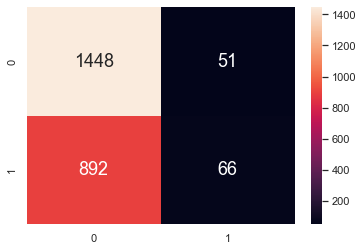

In [54]:
# Predict Potability corresponding to Hardness Train
potability_train_pred = dectree_hardness.predict(hardness_train)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree_hardness.score(hardness_train, potability_train))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(potability_train, potability_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

Classification Accuracy 	: 0.5946275946275946


<AxesSubplot:>

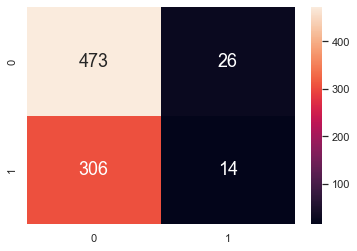

In [55]:
# Predict Potability corresponding to Hardness Test
potability_test_pred = dectree_hardness.predict(hardness_test)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree_hardness.score(hardness_test, potability_test))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(potability_test, potability_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

## <div class="alert alert-block alert-warning"><font color='black'><center>Solids and Potability</font></div>

Plot `Potability` against `Solids` to visualize their mutual relationship.

In [56]:
# Response: Potability
# Extract solids from the Data
solids = pd.DataFrame(waterdata['Solids'])          # Predictor

<AxesSubplot:>

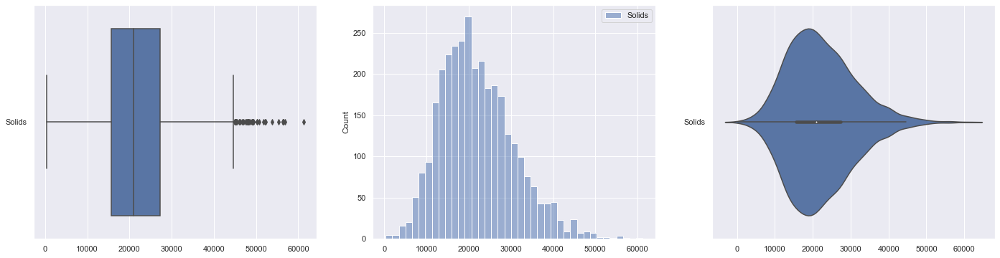

In [57]:
# Plot the distributions of Solids
f, axes = plt.subplots(1, 3, figsize=(24, 6))
sb.boxplot(data = solids, orient = "h", ax = axes[0])
sb.histplot(data = solids, ax = axes[1])
sb.violinplot(data = solids, orient = "h", ax = axes[2])

<AxesSubplot:xlabel='Solids', ylabel='Potability'>

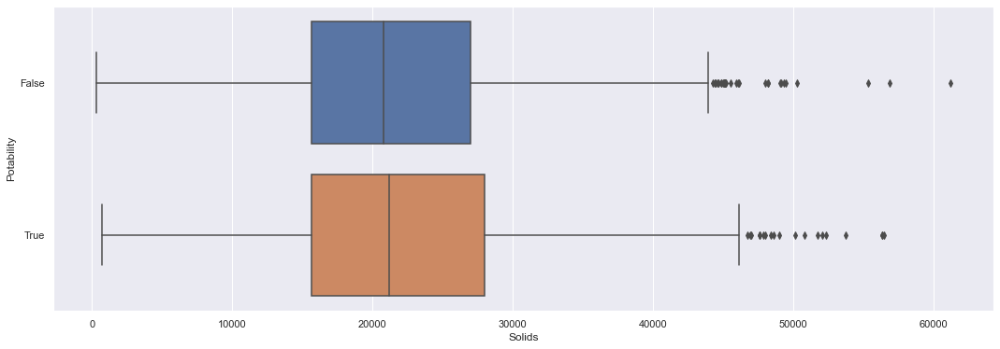

In [58]:
# Create a joint dataframe by concatenating Solids and Potability
Solids_Potability = pd.concat([solids, potability], axis = 1).reindex(solids.index)

# Plot Joint Boxplot of Solids against Potability
f = plt.figure(figsize=(18, 6))
sb.boxplot(x = "Solids", y = "Potability", data = Solids_Potability, orient="h")

<AxesSubplot:xlabel='Solids', ylabel='Potability'>

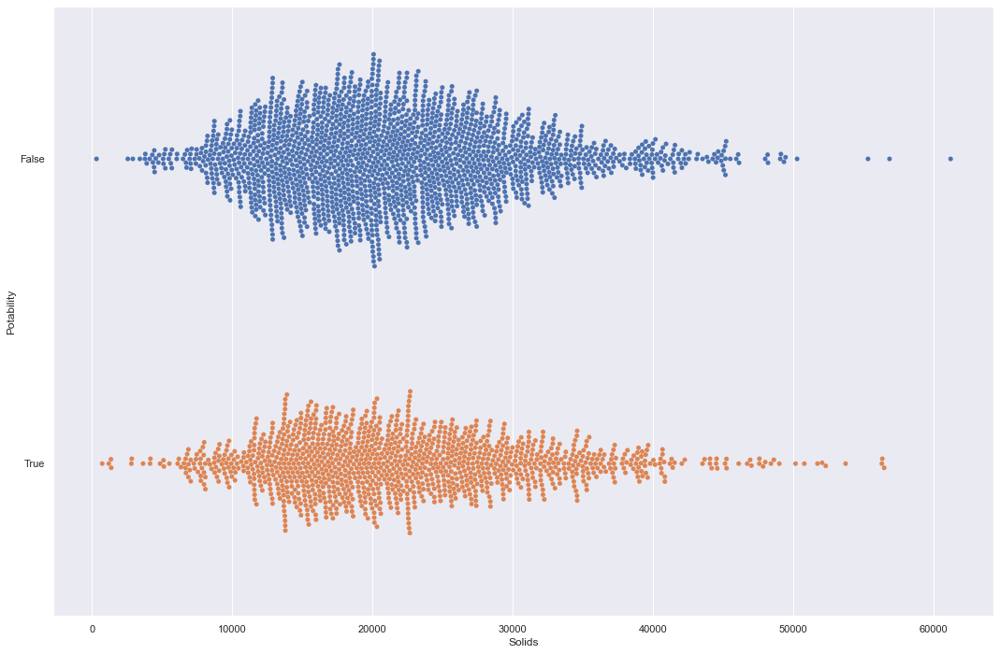

In [59]:
# Plot Joint Swarmplot of Solids against Potability
f = plt.figure(figsize=(18, 12))
sb.swarmplot(x = "Solids", y = "Potability", data = Solids_Potability, orient = "h")

In [60]:
# Split the Potability-Solids Dataset into Train and Test
solids_train, solids_test = train_test_split(solids, test_size = 0.25, random_state = random_seed)

In [61]:
# Summary Statistics for Solids Train
solids_train.describe()

,Solids
count,2457.000000
mean,22060.666861
std,8730.695717
min,320.942611
25%,15751.449150
50%,21038.442613
75%,27355.934306
max,61227.196008


In [62]:
# Create a Decision Tree Classifier object
dectree_solids = DecisionTreeClassifier(max_depth = 3)

In [63]:
# Train the Decision Tree Classifier model
dectree_solids.fit(solids_train, potability_train)

DecisionTreeClassifier(max_depth=3)

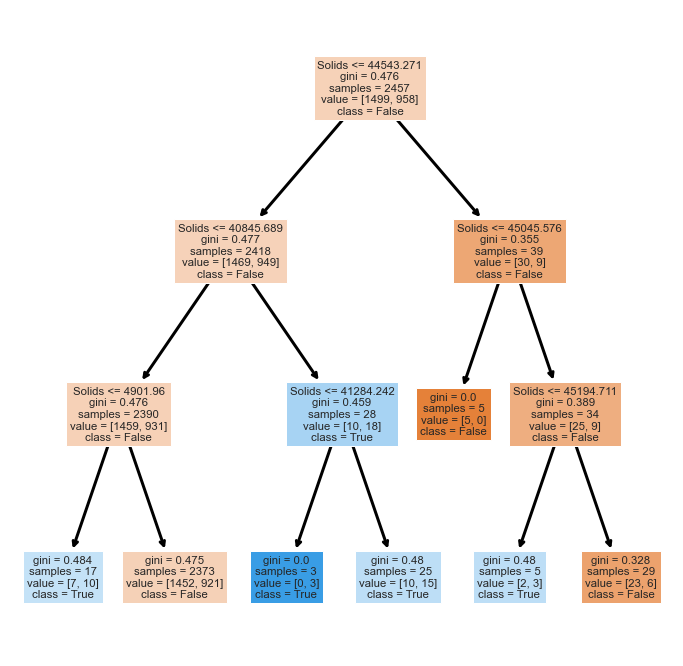

In [64]:
# Plot decision tree for solids to determine its potability
fig, ax = plt.subplots(figsize=(12, 12))
out = plot_tree(dectree_solids, 
          feature_names = solids_train.columns,
          class_names = [str(x) for x in dectree_solids.classes_],
          filled=True)

for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(3)
        
plt.show()

Classification Accuracy 	: 0.6149776149776149


<AxesSubplot:>

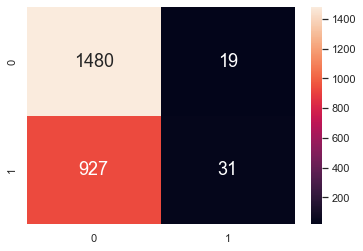

In [65]:
# Predict Potability corresponding to Solids Train
potability_train_pred = dectree_solids.predict(solids_train)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree_solids.score(solids_train, potability_train))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(potability_train, potability_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

Classification Accuracy 	: 0.6031746031746031


<AxesSubplot:>

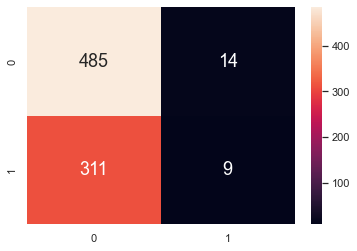

In [66]:
# Predict Potability corresponding to Solids Test
potability_test_pred = dectree_solids.predict(solids_test)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree_solids.score(solids_test, potability_test))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(potability_test, potability_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

## <div class="alert alert-block alert-warning"><font color='black'><center>Chloramines and Potability</font></div>

Plot `Potability` against `Chloramines` to visualize their mutual relationship.

In [67]:
# Response: Potability
# Extract chloramines from the Data
chloramines = pd.DataFrame(waterdata['Chloramines'])          # Predictor

<AxesSubplot:>

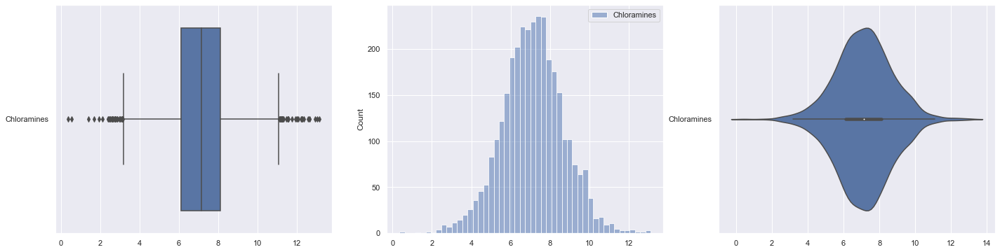

In [68]:
# Plot the distributions of Chloramines
f, axes = plt.subplots(1, 3, figsize=(24, 6))
sb.boxplot(data = chloramines, orient = "h", ax = axes[0])
sb.histplot(data = chloramines, ax = axes[1])
sb.violinplot(data = chloramines, orient = "h", ax = axes[2])

<AxesSubplot:xlabel='Chloramines', ylabel='Potability'>

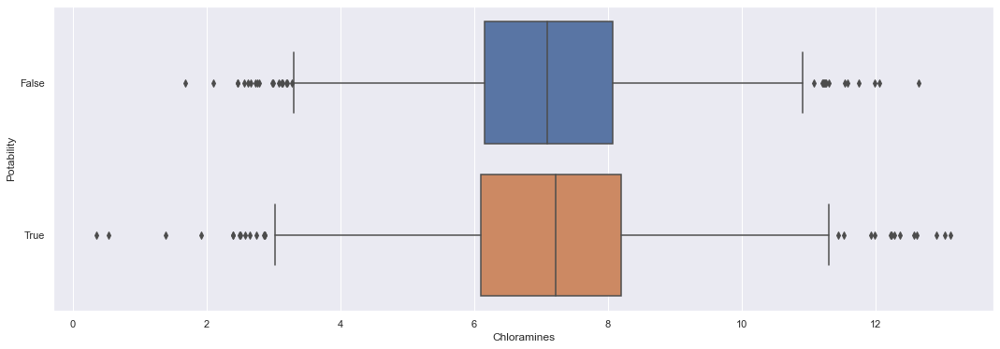

In [69]:
# Create a joint dataframe by concatenating Chloramines and Potability
Chloramines_Potability = pd.concat([chloramines, potability], axis = 1).reindex(chloramines.index)

# Plot Joint Boxplot of Chloramines against Potability
f = plt.figure(figsize=(18, 6))
sb.boxplot(x = "Chloramines", y = "Potability", data = Chloramines_Potability, orient="h")

<AxesSubplot:xlabel='Chloramines', ylabel='Potability'>

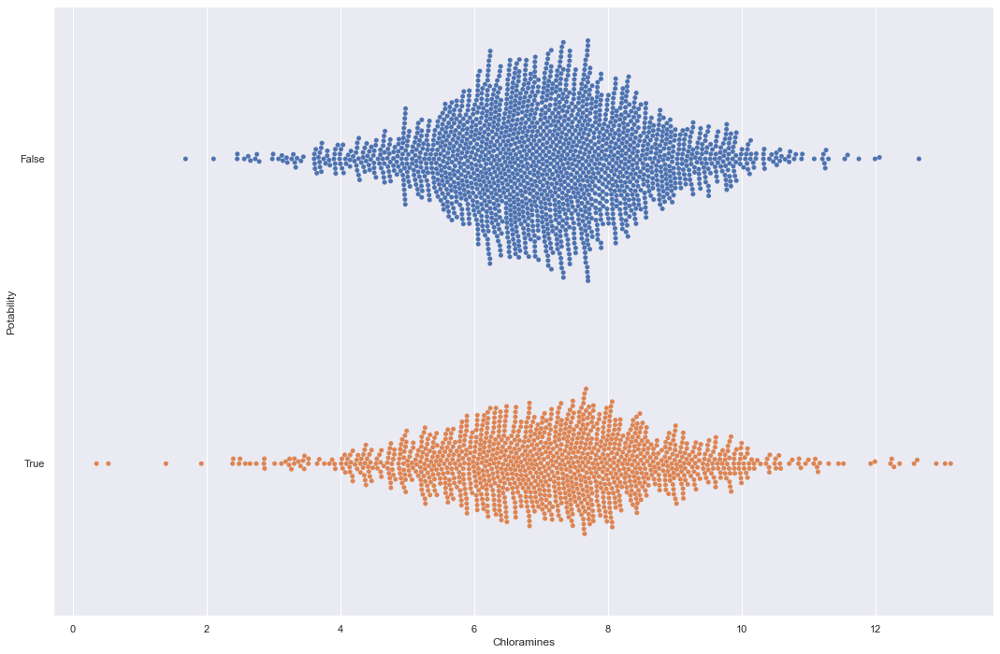

In [70]:
# Plot Joint Swarmplot of Chloramines against Potability
f = plt.figure(figsize=(18, 12))
sb.swarmplot(x = "Chloramines", y = "Potability", data = Chloramines_Potability, orient = "h")

In [71]:
# Split the Potability-Chloramines Dataset into Train and Test
chloramines_train, chloramines_test = train_test_split(chloramines, test_size = 0.25, random_state = random_seed)

In [72]:
# Summary Statistics for Chloramines Train
chloramines_train.describe()

,Chloramines
count,2457.000000
mean,7.133526
std,1.592112
min,0.352000
25%,6.136370
50%,7.136498
75%,8.124232
max,13.127000


In [73]:
# Create a Decision Tree Classifier object
dectree_chloramines = DecisionTreeClassifier(max_depth = 3)

In [74]:
# Train the Decision Tree Classifier model
dectree_chloramines.fit(chloramines_train, potability_train)

DecisionTreeClassifier(max_depth=3)

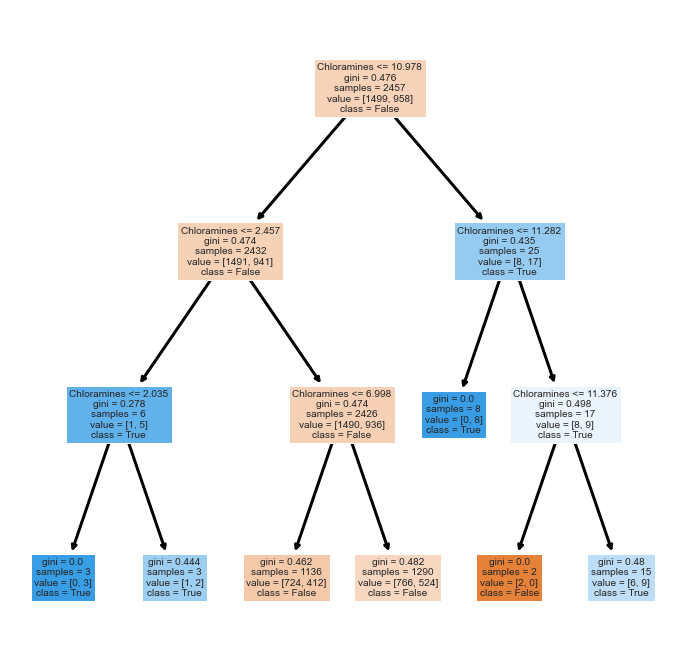

In [75]:
# Plot decision tree for chloramines to determine its potability
fig, ax = plt.subplots(figsize=(12, 12))
out = plot_tree(dectree_chloramines, 
          feature_names = chloramines_train.columns,
          class_names = [str(x) for x in dectree_chloramines.classes_],
          filled=True)

for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(3)
        
plt.show()

Classification Accuracy 	: 0.6161986161986162


<AxesSubplot:>

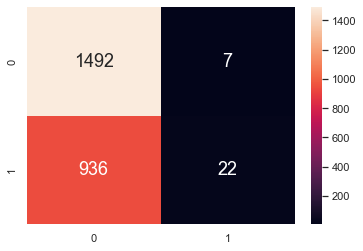

In [76]:
# Predict Potability corresponding to Chloramines Train
potability_train_pred = dectree_chloramines.predict(chloramines_train)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree_chloramines.score(chloramines_train, potability_train))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(potability_train, potability_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

Classification Accuracy 	: 0.6031746031746031


<AxesSubplot:>

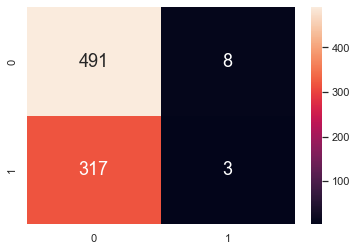

In [77]:
# Predict Potability corresponding to Chloramines Test
potability_test_pred = dectree_chloramines.predict(chloramines_test)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree_chloramines.score(chloramines_test, potability_test))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(potability_test, potability_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

## <div class="alert alert-block alert-warning"><font color='black'><center>Sulfate and Potability</font></div>

Plot `Potability` against `Sulfate` to visualize their mutual relationship.

In [78]:
# Response: Potability
# Extract the sulfate from the Data
sulfate = pd.DataFrame(waterdata['Sulfate'])          # Predictor

<AxesSubplot:>

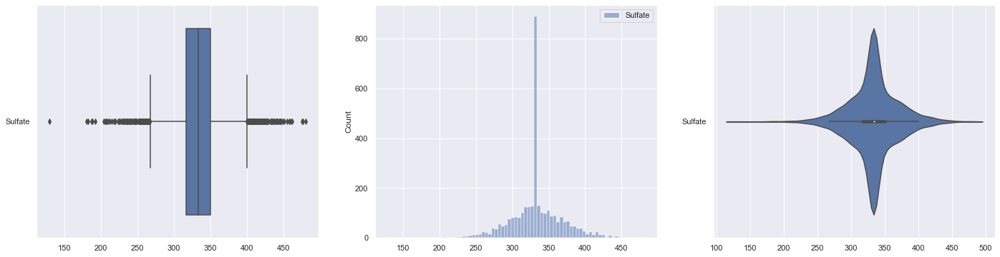

In [79]:
# Plot the distributions of Sulfate
f, axes = plt.subplots(1, 3, figsize=(24, 6))
sb.boxplot(data = sulfate, orient = "h", ax = axes[0])
sb.histplot(data = sulfate, ax = axes[1])
sb.violinplot(data = sulfate, orient = "h", ax = axes[2])

<AxesSubplot:xlabel='Sulfate', ylabel='Potability'>

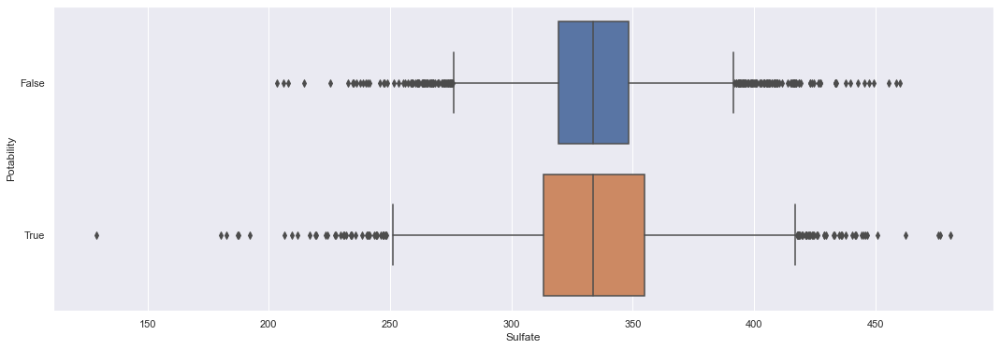

In [80]:
# Create a joint dataframe by concatenating Sulfate and Potability
Sulfate_Potability = pd.concat([sulfate, potability], axis = 1).reindex(sulfate.index)

# Plot Joint Boxplot of Sulfate against potability
f = plt.figure(figsize=(18, 6))
sb.boxplot(x = "Sulfate", y = "Potability", data = Sulfate_Potability, orient="h")

C:\Users\youxi\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 24.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\youxi\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 20.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


<AxesSubplot:xlabel='Sulfate', ylabel='Potability'>

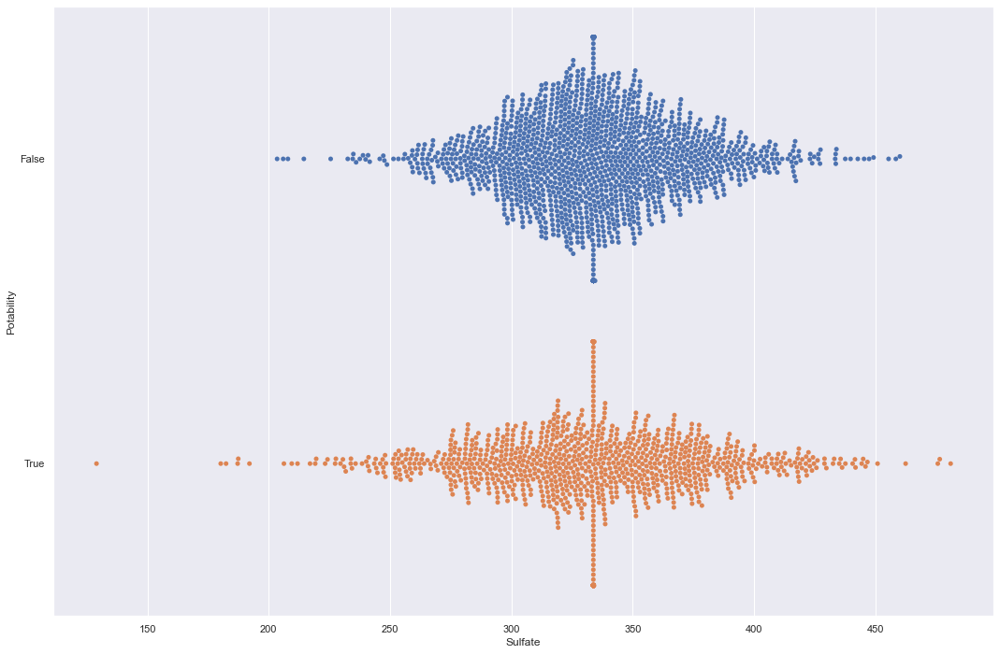

In [81]:
# Plot Joint Swarmplot of Sulfate against Potability
f = plt.figure(figsize=(18, 12))
sb.swarmplot(x = "Sulfate", y = "Potability", data = Sulfate_Potability, orient = "h")

In [82]:
# Split the Potability-Sulfate Dataset into Train and Test
sulfate_train, sulfate_test = train_test_split(sulfate, test_size = 0.25, random_state = random_seed)

In [83]:
# Summary Statistics for Hardness Train
sulfate_train.describe()

,Sulfate
count,2457.000000
mean,333.488186
std,36.130909
min,129.000000
25%,316.973003
50%,333.775777
75%,349.824390
max,481.030642


In [84]:
# Create a Decision Tree Classifier object
dectree_sulfate = DecisionTreeClassifier(max_depth = 3)

In [85]:
# Train the Decision Tree Classifier model
dectree_sulfate.fit(sulfate_train, potability_train)

DecisionTreeClassifier(max_depth=3)

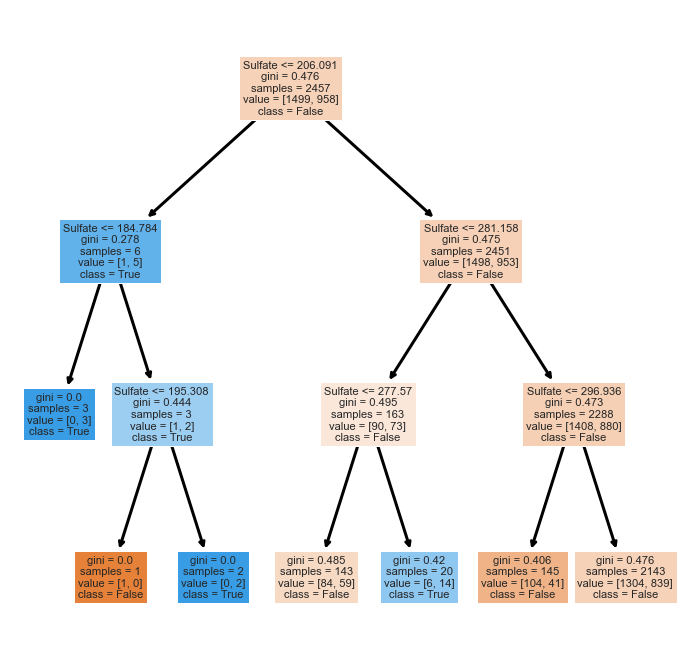

In [86]:
# Plot decision tree for sulfate to determine its potability
from sklearn.tree import plot_tree
fig, ax = plt.subplots(figsize=(12, 12))
out = plot_tree(dectree_sulfate, 
          feature_names = sulfate_train.columns,
          class_names = [str(x) for x in dectree_sulfate.classes_],
          filled=True)

for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(3)
        
plt.show()

Classification Accuracy 	: 0.6153846153846154


<AxesSubplot:>

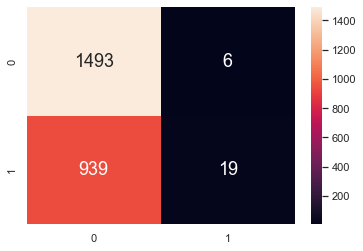

In [87]:
# Predict Potability corresponding to Sulfate Train
potability_train_pred = dectree_sulfate.predict(sulfate_train)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree_sulfate.score(sulfate_train, potability_train))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(potability_train, potability_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

Classification Accuracy 	: 0.6105006105006106


<AxesSubplot:>

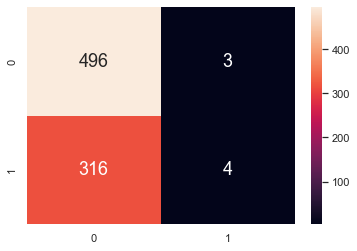

In [88]:
# Predict Potability corresponding to Sulfate Test
potability_test_pred = dectree_sulfate.predict(sulfate_test)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree_sulfate.score(sulfate_test, potability_test))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(potability_test, potability_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

## <div class="alert alert-block alert-warning"><font color='black'><center>Conductivity and Potability</font></div>

Plot `Potability` against `Conductivity` to visualize their mutual relationship.

In [89]:
# Response: Potability
# Extract the conductivity from the Data
conductivity = pd.DataFrame(waterdata['Conductivity'])          # Predictor

<AxesSubplot:>

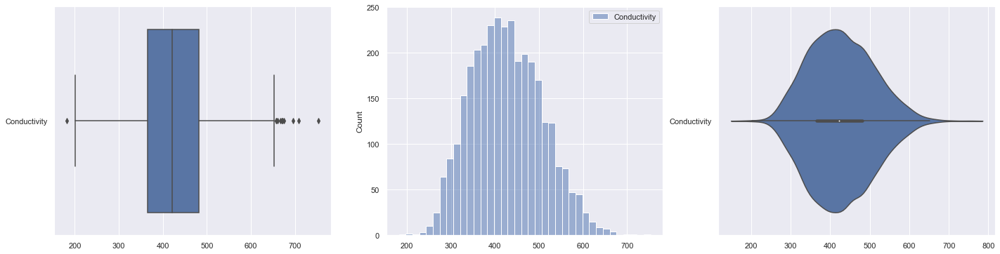

In [90]:
# Plot the distributions of Conductivity
f, axes = plt.subplots(1, 3, figsize=(24, 6))
sb.boxplot(data = conductivity, orient = "h", ax = axes[0])
sb.histplot(data = conductivity, ax = axes[1])
sb.violinplot(data = conductivity, orient = "h", ax = axes[2])

<AxesSubplot:xlabel='Conductivity', ylabel='Potability'>

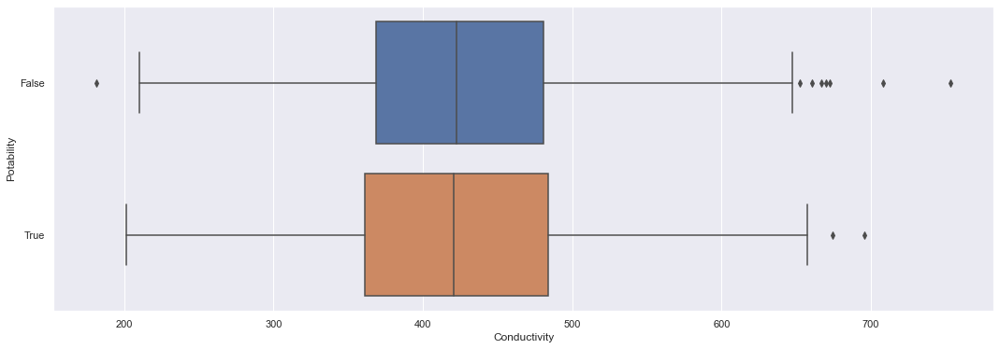

In [91]:
# Create a joint dataframe by concatenating Conductivity and Potability
Conductivity_Potability = pd.concat([conductivity, potability], axis = 1).reindex(conductivity.index)

# Plot Joint Boxplot of Conductivity against potability
f = plt.figure(figsize=(18, 6))
sb.boxplot(x = "Conductivity", y = "Potability", data = Conductivity_Potability, orient="h")

<AxesSubplot:xlabel='Conductivity', ylabel='Potability'>

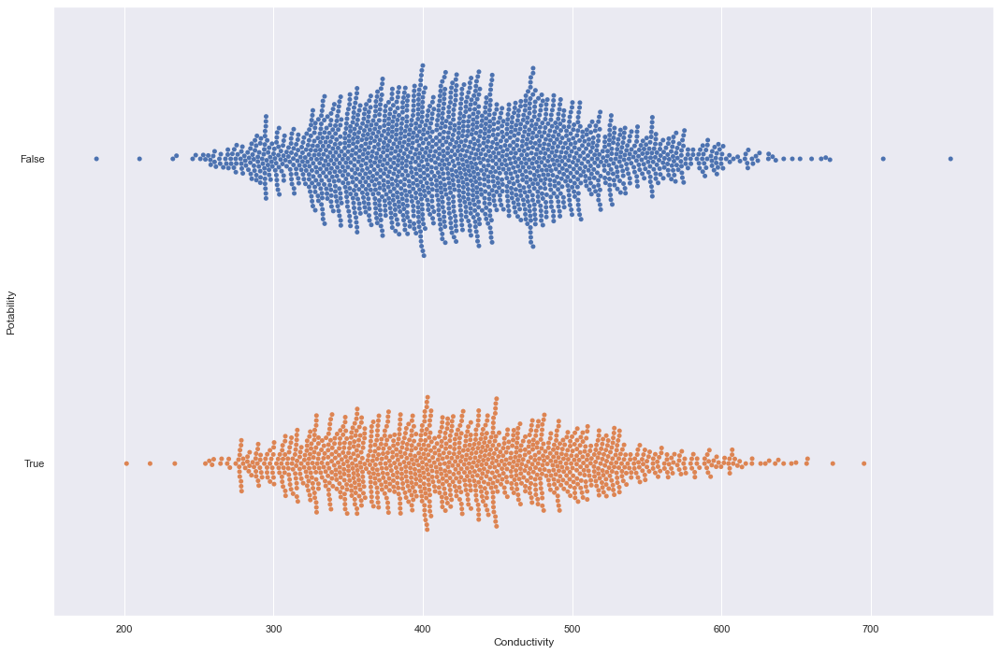

In [92]:
# Plot Joint Swarmplot of Conductivity against Potability
f = plt.figure(figsize=(18, 12))
sb.swarmplot(x = "Conductivity", y = "Potability", data = Conductivity_Potability, orient = "h")

In [93]:
# Split the Potability-Conductivity Dataset into Train and Test
conductivity_train, conductivity_test = train_test_split(conductivity, test_size = 0.25, random_state = random_seed)

In [94]:
# Summary Statistics for Hardness Train
conductivity_train.describe()

,Conductivity
count,2457.000000
mean,426.347084
std,81.091498
min,210.319182
25%,366.491729
50%,422.293819
75%,481.307052
max,753.342620


In [95]:
# Create a Decision Tree Classifier object
dectree_conductivity = DecisionTreeClassifier(max_depth = 3)

In [96]:
# Train the Decision Tree Classifier model
dectree_conductivity.fit(conductivity_train, potability_train)

DecisionTreeClassifier(max_depth=3)

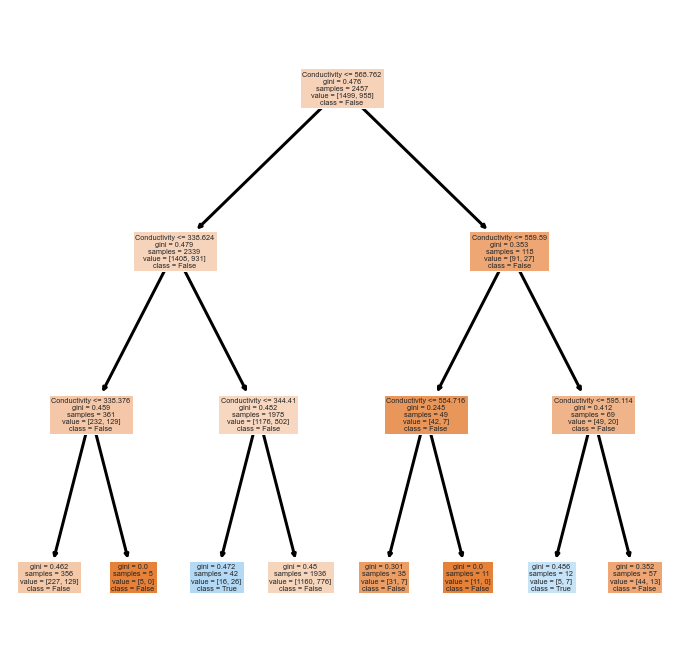

In [97]:
# Plot decision tree for conductivity to determine its potability
from sklearn.tree import plot_tree
fig, ax = plt.subplots(figsize=(12, 12))
out = plot_tree(dectree_conductivity, 
          feature_names = conductivity_train.columns,
          class_names = [str(x) for x in dectree_conductivity.classes_],
          filled=True)

for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(3)
        
plt.show()

Classification Accuracy 	: 0.6149776149776149


<AxesSubplot:>

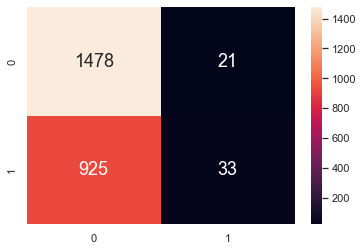

In [98]:
# Predict Potability corresponding to Conductivity Train
potability_train_pred = dectree_conductivity.predict(conductivity_train)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree_conductivity.score(conductivity_train, potability_train))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(potability_train, potability_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

Classification Accuracy 	: 0.6068376068376068


<AxesSubplot:>

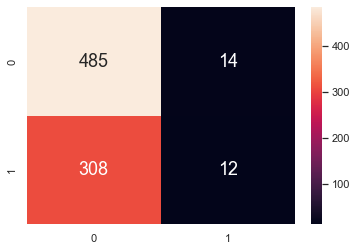

In [99]:
# Predict Potability corresponding to Conductivity Test
potability_test_pred = dectree_conductivity.predict(conductivity_test)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree_conductivity.score(conductivity_test, potability_test))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(potability_test, potability_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

## <div class="alert alert-block alert-warning"><font color='black'><center>Organic Carbon and Potability</font></div>

Plot `Potability` against `Organic Carbon` to visualize their mutual relationship.

In [100]:
# Response: Potability
# Extract the organic carbon from the Data
organic_carbon = pd.DataFrame(waterdata['Organic_carbon'])          # Predictor

<AxesSubplot:>

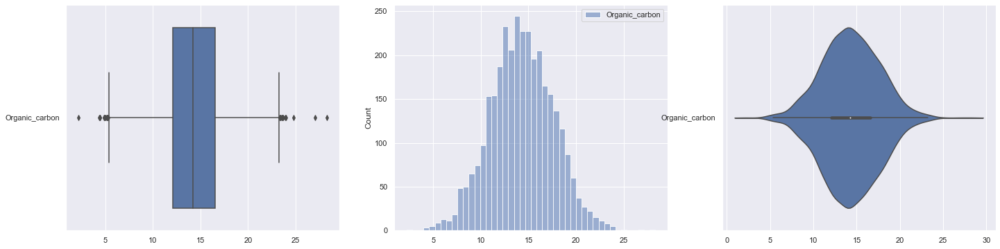

In [101]:
# Plot the distributions of Organic Carbon
f, axes = plt.subplots(1, 3, figsize=(24, 6))
sb.boxplot(data = organic_carbon, orient = "h", ax = axes[0])
sb.histplot(data = organic_carbon, ax = axes[1])
sb.violinplot(data = organic_carbon, orient = "h", ax = axes[2])

<AxesSubplot:xlabel='Organic_carbon', ylabel='Potability'>

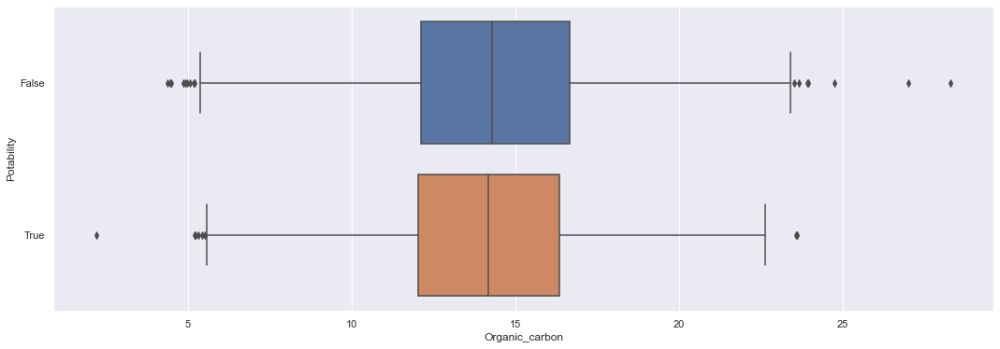

In [102]:
# Create a joint dataframe by concatenating Organic Carbon and Potability
OrganicCarbon_Potability = pd.concat([organic_carbon, potability], axis = 1).reindex(organic_carbon.index)

# Plot Joint Boxplot of Organic Carbon against potability
f = plt.figure(figsize=(18, 6))
sb.boxplot(x = "Organic_carbon", y = "Potability", data = OrganicCarbon_Potability, orient="h")

<AxesSubplot:xlabel='Organic_carbon', ylabel='Potability'>

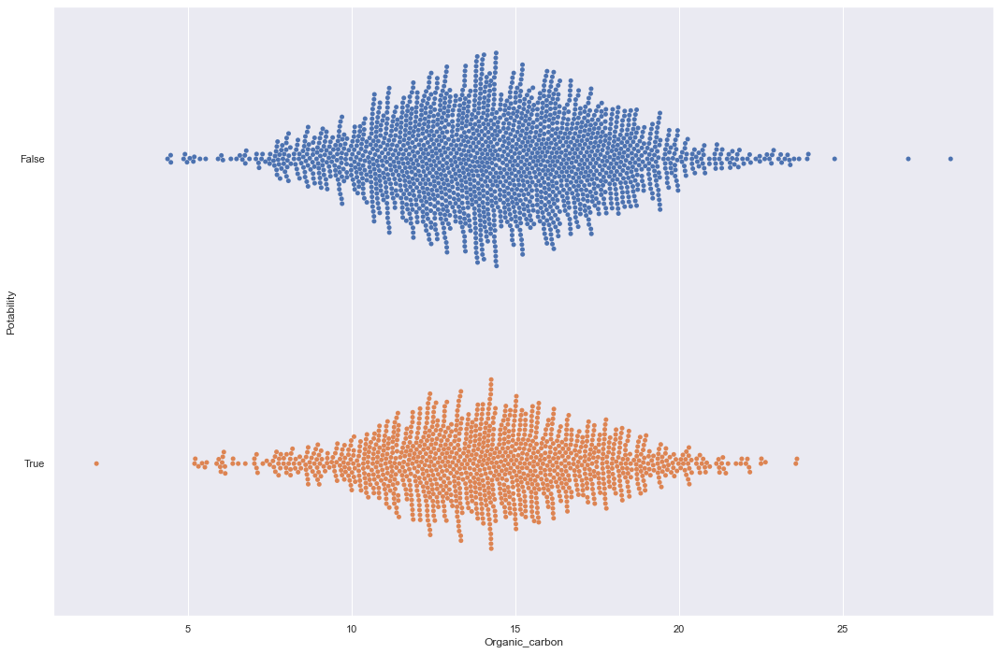

In [103]:
# Plot Joint Swarmplot of Organic Carbon against Potability
f = plt.figure(figsize=(18, 12))
sb.swarmplot(x = "Organic_carbon", y = "Potability", data = OrganicCarbon_Potability, orient = "h")

In [104]:
# Split the Potability-Organic Carbon Dataset into Train and Test
organic_carbon_train, organic_carbon_test = train_test_split(organic_carbon, test_size = 0.25, random_state = random_seed)

In [105]:
# Summary Statistics for Organic Carbon Train
organic_carbon_train.describe()

,Organic_carbon
count,2457.000000
mean,14.298459
std,3.279682
min,2.200000
25%,12.091189
50%,14.205221
75%,16.568656
max,28.300000


In [106]:
# Create a Decision Tree Classifier object
dectree_organic_carbon = DecisionTreeClassifier(max_depth = 3)

In [107]:
# Train the Decision Tree Classifier model
dectree_organic_carbon.fit(organic_carbon_train, potability_train)

DecisionTreeClassifier(max_depth=3)

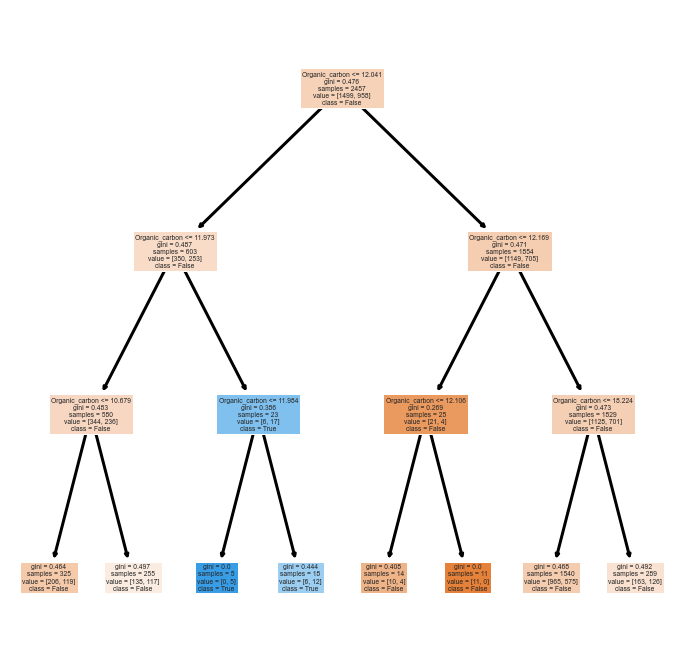

In [108]:
# Plot decision tree for organic carbon to determine its potability
from sklearn.tree import plot_tree
fig, ax = plt.subplots(figsize=(12, 12))
out = plot_tree(dectree_organic_carbon, 
          feature_names = organic_carbon_train.columns,
          class_names = [str(x) for x in dectree_organic_carbon.classes_],
          filled=True)

for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(3)
        
plt.show()

Classification Accuracy 	: 0.6145706145706146


<AxesSubplot:>

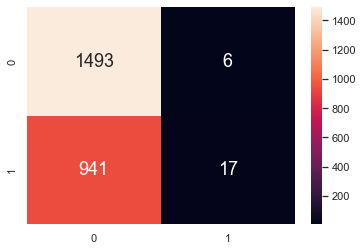

In [109]:
# Predict Potability corresponding to Organic Carbon Train
potability_train_pred = dectree_organic_carbon.predict(organic_carbon_train)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree_organic_carbon.score(organic_carbon_train, potability_train))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(potability_train, potability_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

Classification Accuracy 	: 0.6117216117216118


<AxesSubplot:>

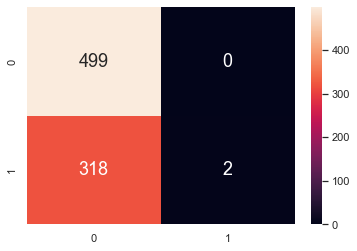

In [110]:
# Predict Potability corresponding to Organic Carbon Test
potability_test_pred = dectree_organic_carbon.predict(organic_carbon_test)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree_organic_carbon.score(organic_carbon_test, potability_test))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(potability_test, potability_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

## <div class="alert alert-block alert-warning"><font color='black'><center>Trihalomethanes and Potability</font></div>

Plot `Potability` against `Trihalomethanes` to visualize their mutual relationship.

In [111]:
# Response: Potability
# Extract the trihalomethanes from the Data
trihalomethanes = pd.DataFrame(waterdata['Trihalomethanes'])          # Predictor

<AxesSubplot:>

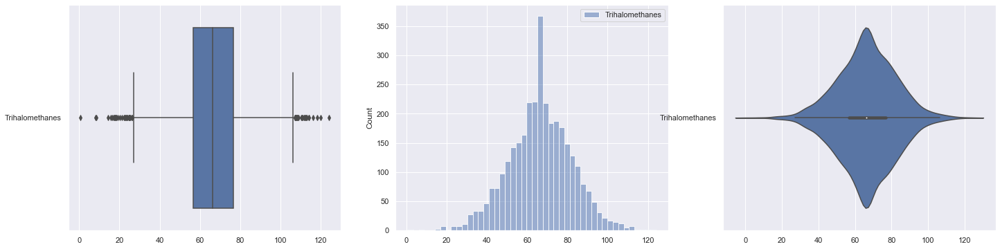

In [112]:
# Plot the distributions of Trihalomethanes
f, axes = plt.subplots(1, 3, figsize=(24, 6))
sb.boxplot(data = trihalomethanes, orient = "h", ax = axes[0])
sb.histplot(data = trihalomethanes, ax = axes[1])
sb.violinplot(data = trihalomethanes, orient = "h", ax = axes[2])

<AxesSubplot:xlabel='Trihalomethanes', ylabel='Potability'>

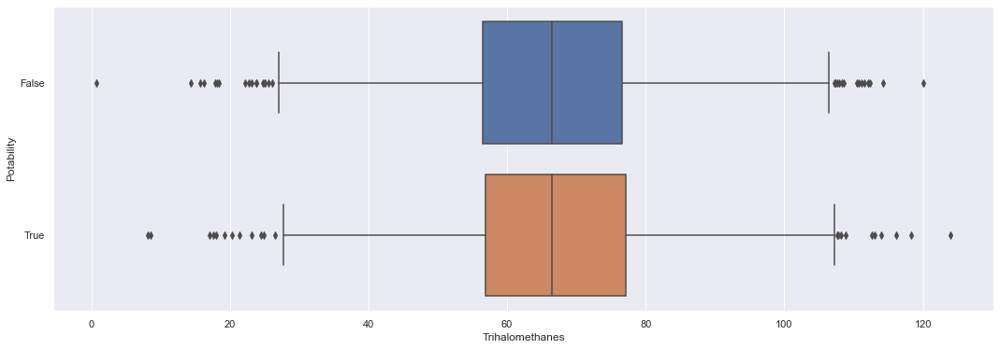

In [113]:
# Create a joint dataframe by concatenating Trihalomethanes and Potability
Trihalomethanes_Potability = pd.concat([trihalomethanes, potability], axis = 1).reindex(trihalomethanes.index)

# Plot Joint Boxplot of Trihalomethanes against potability
f = plt.figure(figsize=(18, 6))
sb.boxplot(x = "Trihalomethanes", y = "Potability", data = Trihalomethanes_Potability, orient="h")

<AxesSubplot:xlabel='Trihalomethanes', ylabel='Potability'>

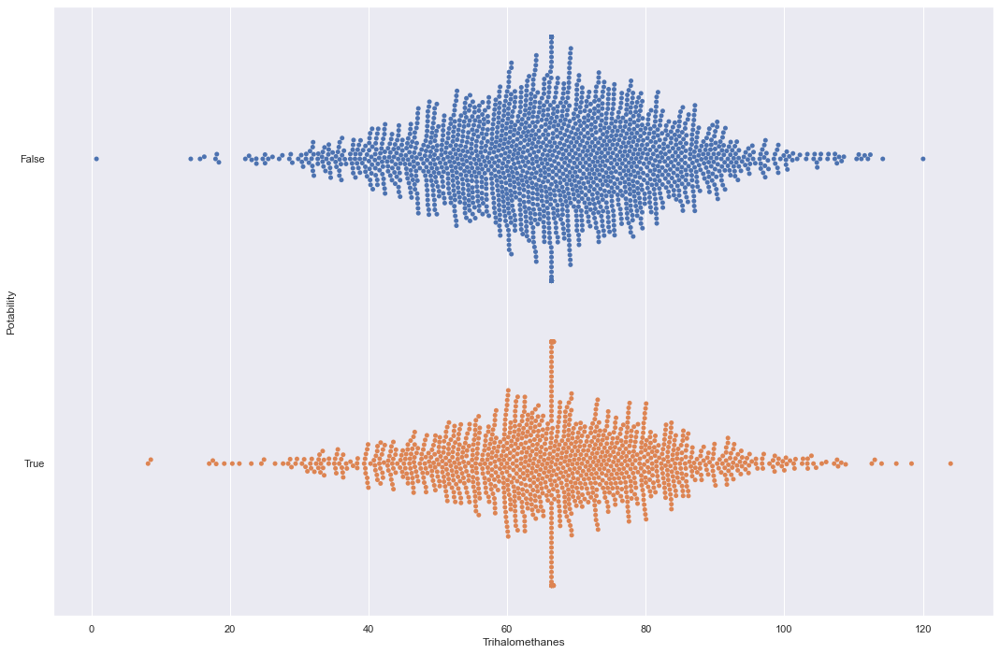

In [114]:
# Plot Joint Swarmplot of Trihalomethanes against Potability
f = plt.figure(figsize=(18, 12))
sb.swarmplot(x = "Trihalomethanes", y = "Potability", data = Trihalomethanes_Potability, orient = "h")

In [115]:
# Split the Potability-Trihalomethanes Dataset into Train and Test
trihalomethanes_train, trihalomethanes_test = train_test_split(trihalomethanes, test_size = 0.25, random_state = random_seed)

In [116]:
# Summary Statistics for Trihalomethanes Train
trihalomethanes_train.describe()

,Trihalomethanes
count,2457.000000
mean,66.268988
std,15.873743
min,8.175876
25%,56.532387
50%,66.396293
75%,76.485911
max,124.000000


In [117]:
# Create a Decision Tree Classifier object
dectree_trihalomethanes = DecisionTreeClassifier(max_depth = 3)

In [118]:
# Train the Decision Tree Classifier model
dectree_trihalomethanes.fit(trihalomethanes_train, potability_train)

DecisionTreeClassifier(max_depth=3)

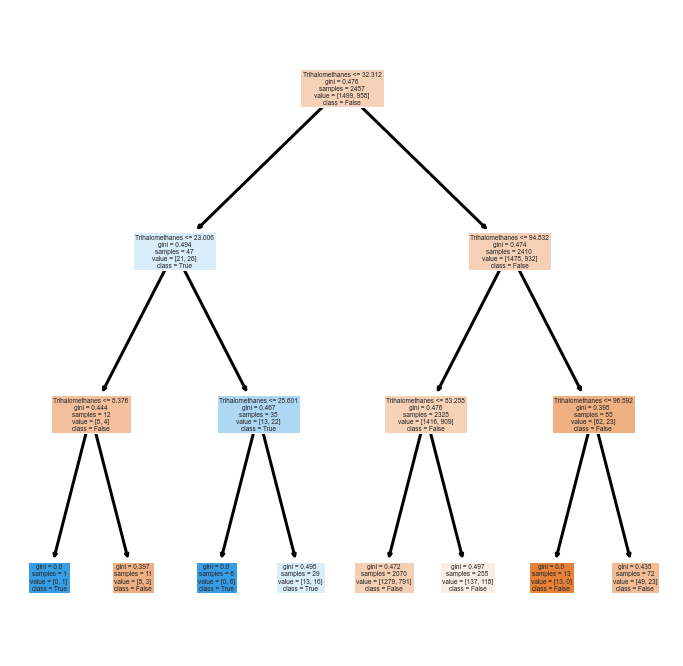

In [119]:
# Plot decision tree for trihalomethanes to determine its potability 
from sklearn.tree import plot_tree
fig, ax = plt.subplots(figsize=(12, 12))
out = plot_tree(dectree_trihalomethanes, 
          feature_names = trihalomethanes_train.columns,
          class_names = [str(x) for x in dectree_trihalomethanes.classes_],
          filled=True)

for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(3)
        
plt.show()

Classification Accuracy 	: 0.6141636141636142


<AxesSubplot:>

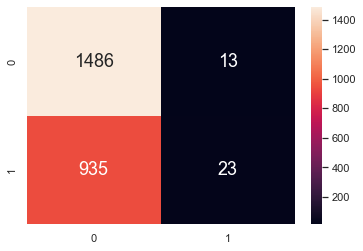

In [120]:
# Predict Potability corresponding to Trihalomethanes Train
potability_train_pred = dectree_trihalomethanes.predict(trihalomethanes_train)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree_trihalomethanes.score(trihalomethanes_train, potability_train))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(potability_train, potability_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

Classification Accuracy 	: 0.6043956043956044


<AxesSubplot:>

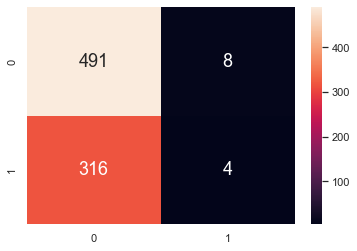

In [121]:
# Predict Potability corresponding to Trihalomethanes Test
potability_test_pred = dectree_trihalomethanes.predict(trihalomethanes_test)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree_trihalomethanes.score(trihalomethanes_test, potability_test))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(potability_test, potability_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

## <div class="alert alert-block alert-warning"><font color='black'><center>Turbidity and Potability</font></div>

Plot `Potability` against `Turbidity` to visualize their mutual relationship.

In [122]:
# Response: Potability
# Extract the turbidity from the Data
turbidity = pd.DataFrame(waterdata['Turbidity'])          # Predictor

<AxesSubplot:>

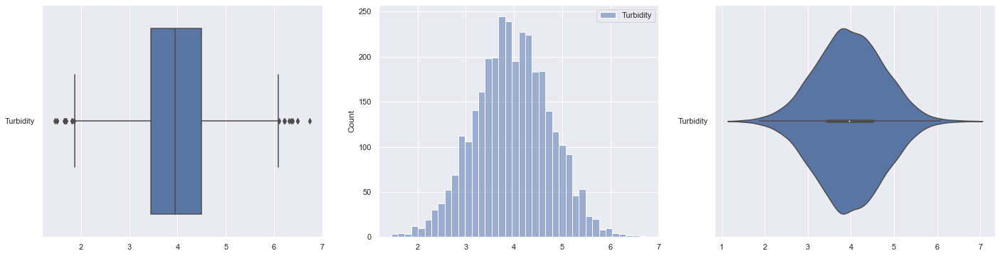

In [123]:
# Plot the distributions of Turbidity
f, axes = plt.subplots(1, 3, figsize=(24, 6))
sb.boxplot(data = turbidity, orient = "h", ax = axes[0])
sb.histplot(data = turbidity, ax = axes[1])
sb.violinplot(data = turbidity, orient = "h", ax = axes[2])

<AxesSubplot:xlabel='Turbidity', ylabel='Potability'>

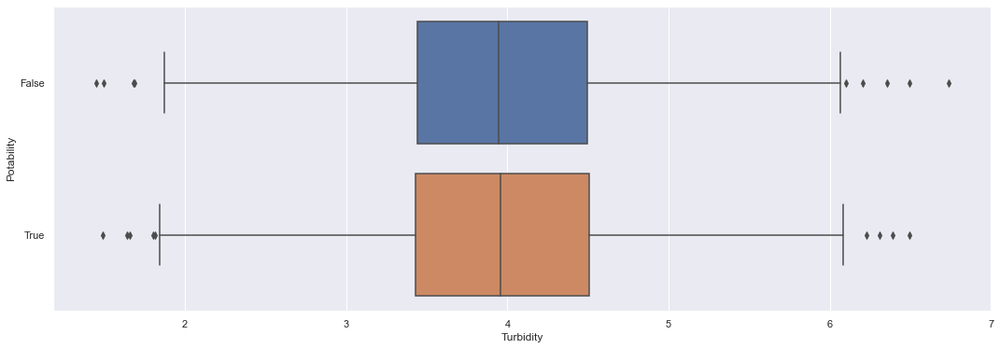

In [124]:
# Create a joint dataframe by concatenating Turbidity and Potability
Turbidity_Potability = pd.concat([turbidity, potability], axis = 1).reindex(turbidity.index)

# Plot Joint Boxplot of Turbidity against potability
f = plt.figure(figsize=(18, 6))
sb.boxplot(x = "Turbidity", y = "Potability", data = Turbidity_Potability, orient="h")

<AxesSubplot:xlabel='Turbidity', ylabel='Potability'>

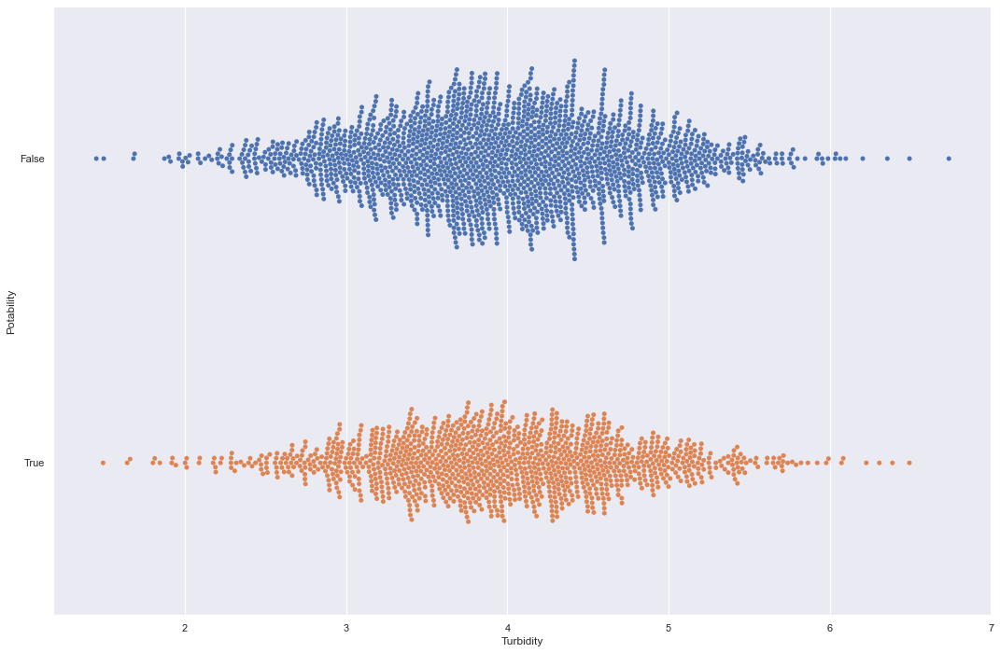

In [125]:
# Plot Joint Swarmplot of Turbidity against Potability
f = plt.figure(figsize=(18, 12))
sb.swarmplot(x = "Turbidity", y = "Potability", data = Turbidity_Potability, orient = "h")

In [126]:
# Split the Potability-Turbidity Dataset into Train and Test
turbidity_train, turbidity_test = train_test_split(turbidity, test_size = 0.25, random_state = random_seed)

In [127]:
# Summary Statistics for Turbidity Train
turbidity_train.describe()

,Turbidity
count,2457.000000
mean,3.974932
std,0.787492
min,1.450000
25%,3.450746
50%,3.959294
75%,4.511384
max,6.739000


In [128]:
# Create a Decision Tree Classifier object
dectree_turbidity = DecisionTreeClassifier(max_depth = 3)

In [129]:
# Train the Decision Tree Classifier model
dectree_turbidity.fit(turbidity_train, potability_train)

DecisionTreeClassifier(max_depth=3)

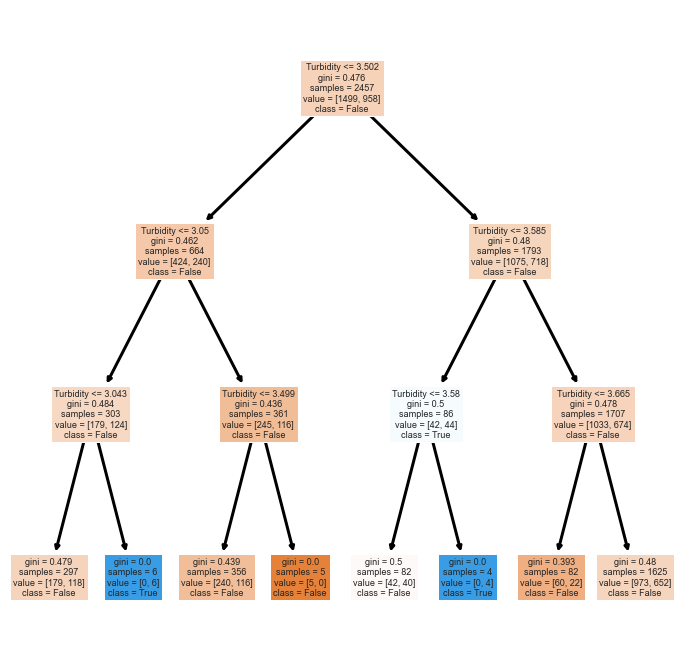

In [130]:
# Plot decision tree for turbidity to determine its potability
from sklearn.tree import plot_tree
fig, ax = plt.subplots(figsize=(12, 12))
out = plot_tree(dectree_turbidity, 
          feature_names = turbidity_train.columns,
          class_names = [str(x) for x in dectree_turbidity.classes_],
          filled=True)

for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(3)
        
plt.show()

Classification Accuracy 	: 0.6141636141636142


<AxesSubplot:>

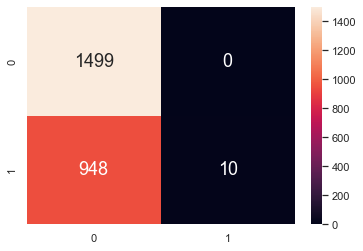

In [131]:
# Predict Potability corresponding to Turbidity Train
potability_train_pred = dectree_turbidity.predict(turbidity_train)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree_turbidity.score(turbidity_train, potability_train))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(potability_train, potability_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

Classification Accuracy 	: 0.6092796092796092


<AxesSubplot:>

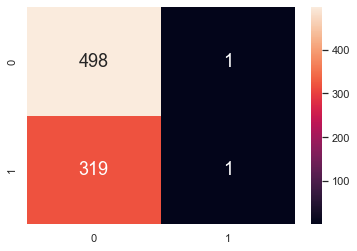

In [132]:
# Predict Potability corresponding to Turbidity Test
potability_test_pred = dectree_turbidity.predict(turbidity_test)

# Print the Classification Accuracy
print("Classification Accuracy \t:", dectree_turbidity.score(turbidity_test, potability_test))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(potability_test, potability_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

## <div class="alert alert-block alert-warning"><font color='black'><center>Predicting Potability using all Variables</font></div>

In [133]:
# Extract Predictors; Response already extracted
predictors = pd.DataFrame(waterdata[["ph", "Hardness", "Solids", "Chloramines", "Sulfate", "Conductivity","Organic_carbon", "Trihalomethanes", "Turbidity", ]])

In [134]:
# Split the Dataset into Train and Test
predictors_train, predictors_test = train_test_split(predictors, test_size = 0.25, random_state = random_seed)

# Check the sample sizes
print("Train Set :", potability_train.shape, predictors_train.shape)
print("Test Set  :", potability_test.shape, predictors_test.shape)

Train Set : (2457, 1) (2457, 9)
Test Set  : (819, 1) (819, 9)


In [135]:
# Summary Statistics for Response
potability_train["Potability"].value_counts()

False    1499
True      958
Name: Potability, dtype: int64

In [136]:
# Summary Statistics for Predictors
predictors_train.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
count,2457.000000,2457.000000,2457.000000,2457.000000,2457.000000,2457.000000,2457.000000,2457.000000,2457.000000
mean,7.096702,196.715513,22060.666861,7.133526,333.488186,426.347084,14.298459,66.268988,3.974932
std,1.490540,32.985373,8730.695717,1.592112,36.130909,81.091498,3.279682,15.873743,0.787492
min,0.000000,47.432000,320.942611,0.352000,129.000000,210.319182,2.200000,8.175876,1.450000
25%,6.280905,176.640063,15751.449150,6.136370,316.973003,366.491729,12.091189,56.532387,3.450746
50%,7.080795,197.191839,21038.442613,7.136498,333.775777,422.293819,14.205221,66.396293,3.959294
75%,7.893313,217.368014,27355.934306,8.124232,349.824390,481.307052,16.568656,76.485911,4.511384
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000


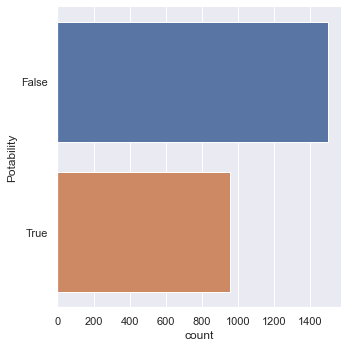

In [137]:
# Draw the distribution of Response
sb.catplot(y = "Potability", data = potability_train, kind = "count")

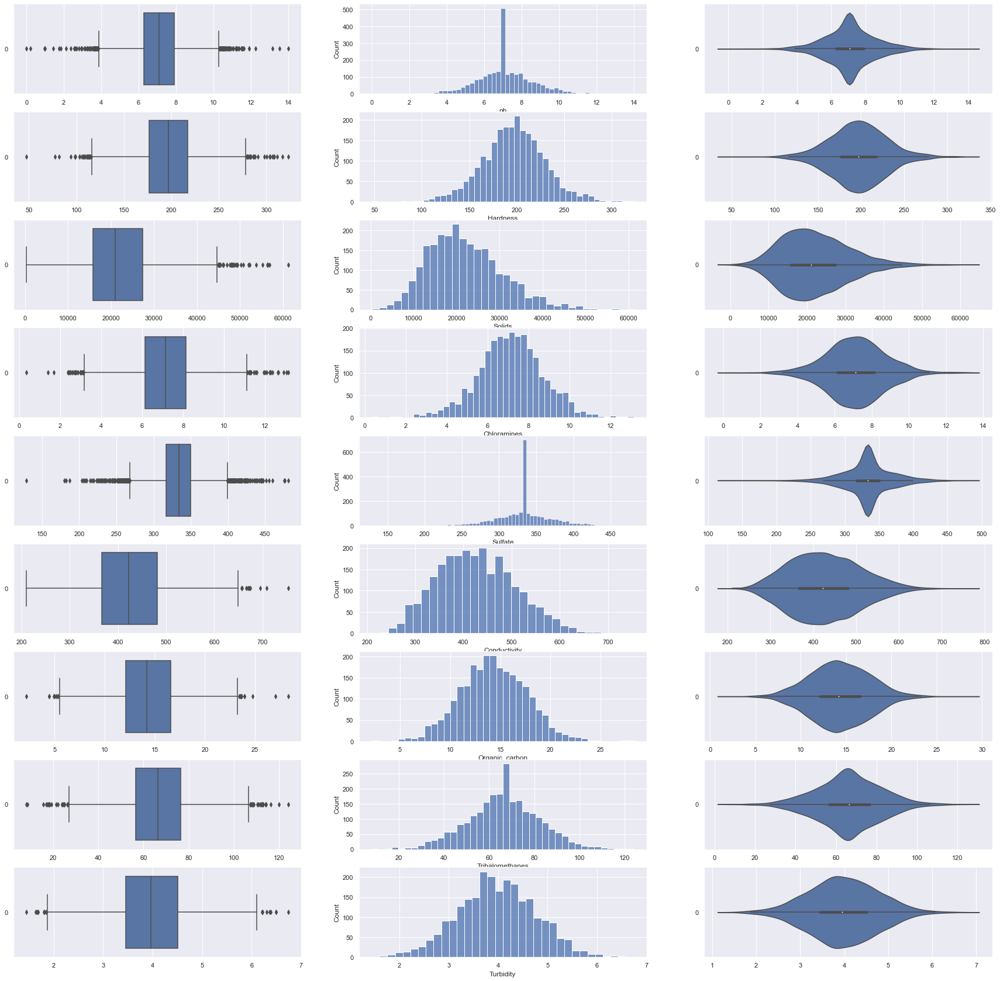

In [138]:
# Draw the distributions of all variables
f, axes = plt.subplots(9, 3, figsize=(30, 30))

count = 0
for var in predictors_train:
    sb.boxplot(data = predictors_train[var], orient = "h", ax = axes[count,0])
    sb.histplot(data = predictors_train[var], ax = axes[count,1])
    sb.violinplot(data = predictors_train[var], orient = "h", ax = axes[count,2])
    count += 1

C:\Users\youxi\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 14.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\youxi\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\youxi\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 8.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\youxi\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 6.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\youxi\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 20.1% of the points c

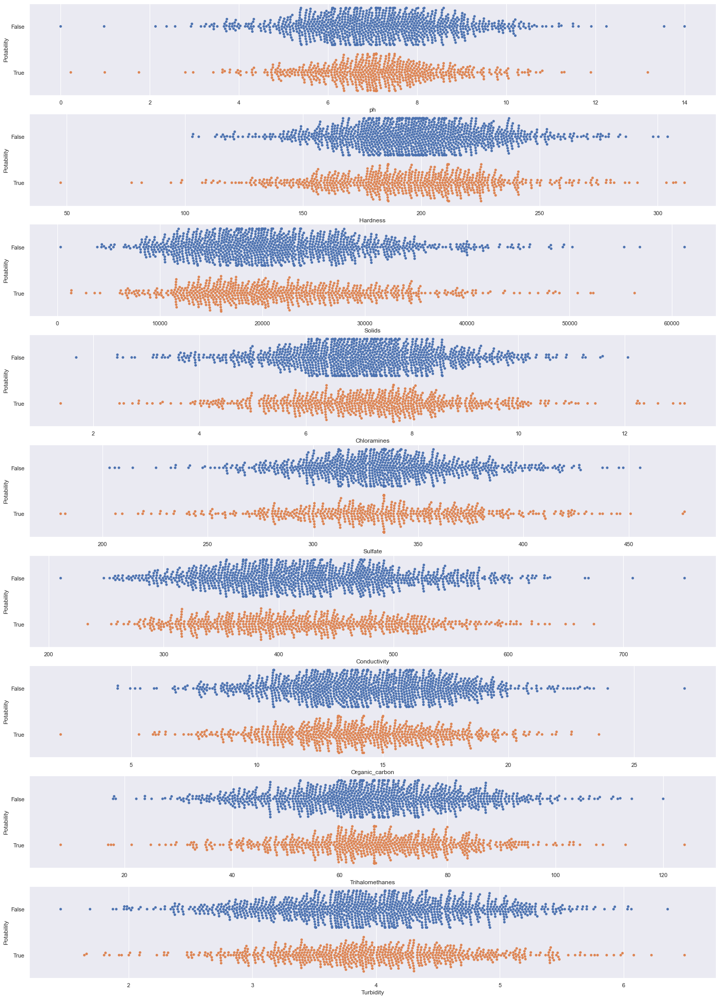

In [139]:
# Relationship between Response and the Predictors
trainDF = pd.concat([potability_train, predictors_train], axis = 1).reindex(potability_train.index)

f, axes = plt.subplots(9, 1, figsize=(24, 35))

count = 0
for var in predictors_train:
    sb.swarmplot(x = var, y = "Potability", data = trainDF, orient = "h", ax = axes[count])
    count += 1

## Predicting optimal depth of the tree

In [140]:
# Setting parameters for Decision Tree Classifier
dt = DecisionTreeClassifier()
dt.fit(predictors_train, potability_train)
DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
 max_features=None, max_leaf_nodes=None, min_samples_leaf=1,
 min_samples_split=2, min_weight_fraction_leaf=0.0, random_state=None, splitter='best')
potability_pred = dt.predict(predictors_test)

In [141]:
# Calculate area under ROC curve 
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(potability_test, potability_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.5196392785571141

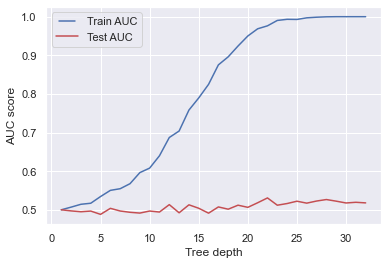

In [142]:
#Plot an area under curve (auc) against Tree depth graph to determine the optimal tree depth
max_depths = np.linspace(1, 32, 32, endpoint=True)
train_results = []
test_results = []
for max_depth in max_depths:
   dt = DecisionTreeClassifier(max_depth=max_depth)
   dt.fit(predictors_train, potability_train)
   train_pred = dt.predict(predictors_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(potability_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)

   # Add auc score to previous train results
   train_results.append(roc_auc)
   potability_pred = dt.predict(predictors_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(potability_test, potability_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
    
   # Add auc score to previous test results
   test_results.append(roc_auc)
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(max_depths, train_results, 'b', label="Train AUC")
line2, = plt.plot(max_depths, test_results, 'r', label="Test AUC")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('AUC score')
plt.xlabel('Tree depth')
plt.show()

From the AUC graph, we can see that the AUC score of test AUC are highest at depth 22. This means that it is the optimal depth of the decision tree is at 22.

In [225]:
# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 22)   # create the decision tree object
dectree.fit(predictors_train, potability_train)    # train the decision tree model

DecisionTreeClassifier(max_depth=22)

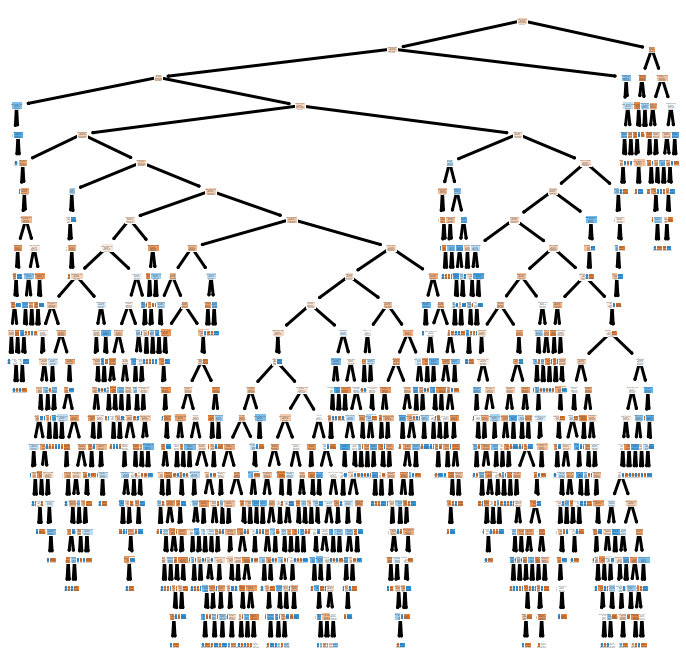

In [226]:
# Plot the trained Decision Tree with all variables
fig, ax = plt.subplots(figsize=(12, 12))
out = plot_tree(dectree, 
          feature_names = predictors_train.columns,
          class_names = [str(x) for x in dectree.classes_],
          filled=True)

for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(3)
        
plt.show()

#### Goodness of Fit of the Model

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.787952787952788



<AxesSubplot:>

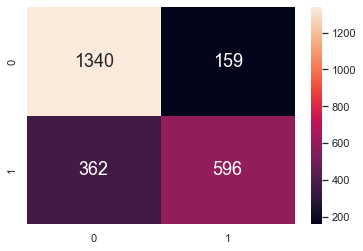

In [145]:
potability_train_pred = dectree.predict(predictors_train)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(predictors_train, potability_train))
print()

# Plot the Confusion Matrix for Train data
sb.heatmap(confusion_matrix(potability_train, potability_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

In [146]:
# Allocate counts into their respective groups
matrix_train = confusion_matrix(potability_train, potability_train_pred)
TP = matrix_train[1,1]
TN = matrix_train[0,0]
FP = matrix_train[0,1]
FN = matrix_train[1,0]

# Calculate TPR, TNR, FPR and FNR
print('TRAIN DATA:')
print('TPR = ',TP/(TP + FN))
print('TNR = ',TN/(TN + FP))
print('FPR = ',FP/(TN + FP))
print('FNR = ',FN/(TP + FN))

TRAIN DATA:
TPR =  0.6221294363256785
TNR =  0.8939292861907938
FPR =  0.10607071380920614
FNR =  0.3778705636743215


#### Prediction of Response based on the Predictor

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.5482295482295483



<AxesSubplot:>

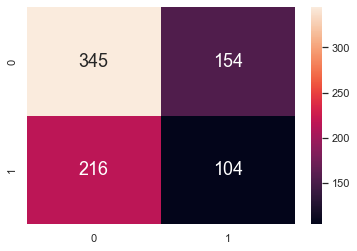

In [147]:
potability_test_pred = dectree.predict(predictors_test)

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(predictors_test, potability_test))
print()

# Plot the Confusion Matrix for test data
sb.heatmap(confusion_matrix(potability_test, potability_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

In [148]:
# Allocate counts into their respective groups
matrix_test = confusion_matrix(potability_test, potability_test_pred)
TP = matrix_test[1,1]
TN = matrix_test[0,0]
FP = matrix_test[0,1]
FN = matrix_test[1,0]

# Calculate TPR, TNR, FPR and FNR
print('TEST DATA:')
print('TPR = ',TP/(TP + FN))
print('TNR = ',TN/(TN + FP))
print('FPR = ',FP/(TN + FP))
print('FNR = ',FN/(TP + FN))

TEST DATA:
TPR =  0.325
TNR =  0.6913827655310621
FPR =  0.30861723446893785
FNR =  0.675


## <div class="alert alert-block alert-warning"><font color='black'><center>Predicting Potability using Important Variables</font></div>

## Extracting Important Features
We use the subset of the variables to determine the potability so that we can try to get a model with better accuracy. 

Feature: 0, Score: 0.00676
Feature: 1, Score: 0.23323
Feature: 2, Score: 0.40496
Feature: 3, Score: 0.00608
Feature: 4, Score: 0.02954
Feature: 5, Score: 0.00886
Feature: 6, Score: 0.00835
Feature: 7, Score: 0.07065
Feature: 8, Score: 0.23156


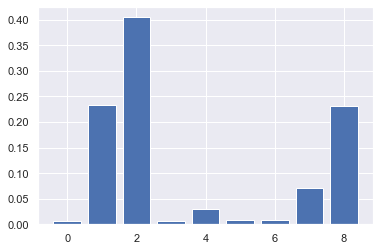

In [149]:
# decision tree for feature importance on a regression problem
from sklearn.datasets import make_regression
from sklearn.tree import DecisionTreeRegressor
from matplotlib import pyplot
# define dataset
predictors, potability = make_regression(n_samples=1000, n_features=9, n_informative=5, random_state=1)
# define the model
model = DecisionTreeRegressor()
# fit the model
model.fit(predictors, potability)
# get importance
importance = model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

Feature 0: ph <br>
Feature 1: Hardness<br>
Feature 2: Solids<br>
Feature 3: Chloramines<br>
Feature 4: Sulfate<br>
Feature 5: Conductivity<br>
Feature 6: Organic_carbon<br>
Feature 7: Trihalomethanes<br>
Feature 8: Turbidity<br>

#### Important Features: Hardness, Solids, Trihalomethanes, Turbidity

In [150]:
# Extract Important Predictors
predictors_imp = pd.DataFrame(waterdata[["Hardness", "Solids", "Trihalomethanes", "Turbidity", ]])

In [151]:
# Split the Dataset into Train and Test
predictors_imp_train, predictors_imp_test = train_test_split(predictors_imp, test_size = 0.25, random_state = random_seed)

# Check the sample sizes
print("Train Set :", potability_train.shape, predictors_imp_train.shape)
print("Test Set  :", potability_test.shape, predictors_imp_test.shape)

Train Set : (2457, 1) (2457, 4)
Test Set  : (819, 1) (819, 4)


In [152]:
# Setting parameters for Decision Tree Classifier
dt = DecisionTreeClassifier()
dt.fit(predictors_imp_train, potability_train)
DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
 max_features=None, max_leaf_nodes=None, min_samples_leaf=1,
 min_samples_split=2, min_weight_fraction_leaf=0.0, random_state=None, splitter='best')
potability_pred = dt.predict(predictors_imp_test)

In [153]:
# Calculate area under curve 
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(potability_test, potability_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.5058491983967937

## Determining Optimum Depth Of Tree

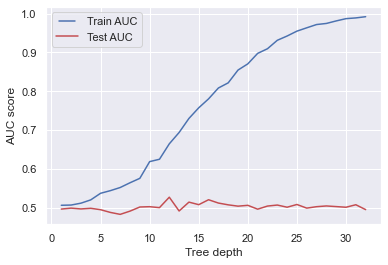

In [154]:
#Plot an area under curve (auc) against Tree depth graph to determine the optimal tree depth
max_depths = np.linspace(1, 32, 32, endpoint=True)
train_results = []
test_results = []
for max_depth in max_depths:
   dt = DecisionTreeClassifier(max_depth=max_depth)
   dt.fit(predictors_imp_train, potability_train)
   train_pred = dt.predict(predictors_imp_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(potability_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)

   # Add auc score to previous train results
   train_results.append(roc_auc)
   potability_pred = dt.predict(predictors_imp_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(potability_test, potability_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
    
   # Add auc score to previous test results
   test_results.append(roc_auc)
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(max_depths, train_results, 'b', label="Train AUC")
line2, = plt.plot(max_depths, test_results, 'r', label="Test AUC")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('AUC score')
plt.xlabel('Tree depth')
plt.show()

From the AUC graph, we can see that the AUC score of test AUC are highest at depth 12. This means that it is the optimal depth of the decision tree is at 12 

## Decision Tree

In [155]:
# Import DecisionTreeClassifier model from Scikit-Learn
from sklearn.tree import DecisionTreeClassifier

# Decision Tree using Train Data
dectree_imp = DecisionTreeClassifier(max_depth = 12)       # create the decision tree object
dectree_imp.fit(predictors_imp_train, potability_train)    # train the decision tree model

DecisionTreeClassifier(max_depth=12)

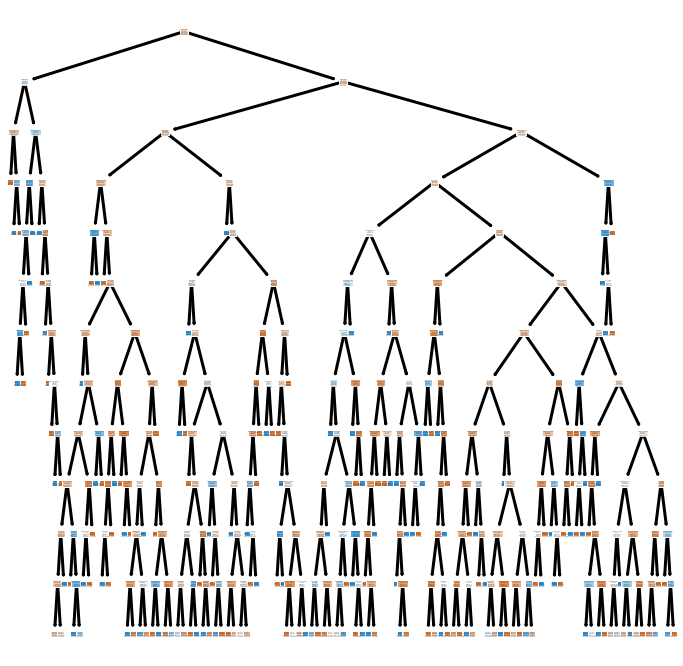

In [156]:
# Plot the trained Decision Tree with important predictors
fig, ax = plt.subplots(figsize=(12, 12))
out = plot_tree(dectree_imp, 
          feature_names = predictors_train.columns,
          class_names = [str(x) for x in dectree.classes_],
          filled=True)

for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(3)
        
plt.show()

#### Goodness of Fit of the Model

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.7232397232397232



<AxesSubplot:>

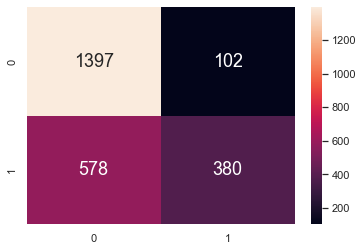

In [157]:
potability_train_pred = dectree_imp.predict(predictors_imp_train)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree_imp.score(predictors_imp_train, potability_train))
print()

# Plot the Confusion Matrix for Train data
sb.heatmap(confusion_matrix(potability_train, potability_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

#### Prediction of Response based on the Predictor

In [ ]:
# potability_test_pred = dectree_imp.predict(predictors_imp_test)

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree_imp.score(predictors_imp_test, potability_test))
print()

# Plot the Confusion Matrix for Test data
sb.heatmap(confusion_matrix(potability_test, potability_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

The Classification Tree consisting of the important variables have a higher model accuracy by 0.0415 than the model using all variables.

# <div class="alert alert-block alert-info"><font color='black'><center>Spot Checking</font></div>

Spot Checking is used to find the `baseline of the data`.

In [159]:
# Modelling Libraries

from sklearn.linear_model import LogisticRegression,RidgeClassifier,SGDClassifier,PassiveAggressiveClassifier
from sklearn.linear_model import Perceptron
from sklearn.svm import SVC,LinearSVC,NuSVC
from sklearn.neighbors import KNeighborsClassifier,NearestCentroid
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB,BernoulliNB
from sklearn.ensemble import VotingClassifier

In [160]:
# Evaluation & CV Libraries

from sklearn.metrics import precision_score,accuracy_score
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV,RepeatedStratifiedKFold

In [161]:
from warnings import filterwarnings

filterwarnings('ignore')
models =[("LR", LogisticRegression(max_iter=1000)),("SVC", SVC()),('KNN',KNeighborsClassifier(n_neighbors=10)),
         ("DTC", DecisionTreeClassifier()),("GNB", GaussianNB()),
        ("SGDC", SGDClassifier()),("Perc", Perceptron()),("NC",NearestCentroid()),
        ("Ridge", RidgeClassifier()),("NuSVC", NuSVC()),("BNB", BernoulliNB()),
         ('RF',RandomForestClassifier()),('ADA',AdaBoostClassifier()),
        ('XGB',GradientBoostingClassifier()),('PAC',PassiveAggressiveClassifier())]

results = []
names = []
finalResults = []

for name,model in models:
    model.fit(predictors_train, potability_train)
    model_results = model.predict(predictors_test)
    score = precision_score(potability_test, model_results,average='macro')
    results.append(score)
    names.append(name)
    finalResults.append((name,score))
    
finalResults.sort(key=lambda k:k[1],reverse=True)

In [162]:
finalResults

[('KNN', 0.5378267611874169),
 ('XGB', 0.5205026455026455),
 ('NC', 0.5201626016260162),
 ('DTC', 0.5173234299946629),
 ('ADA', 0.5149418405747519),
 ('NuSVC', 0.4968063362289218),
 ('GNB', 0.4705513784461153),
 ('RF', 0.46915248627926864),
 ('PAC', 0.44482120838471023),
 ('LR', 0.3046398046398046),
 ('SVC', 0.3046398046398046),
 ('SGDC', 0.3046398046398046),
 ('Perc', 0.3046398046398046),
 ('Ridge', 0.3046398046398046),
 ('BNB', 0.3046398046398046)]

For Random forest (RF), the accuracy is 0.4977440525020509. This is a moderately accurate model. We choose to use this model because it is more suitable to use for our prediction, especially with our data.

# <div class="alert alert-block alert-info"><font color='black'><center>Random Forest Classification</font></div>

In [163]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, make_scorer
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline

# Custom scorer for cross validation
scorer = make_scorer(f1_score, greater_is_better=True, average = 'macro')

In [164]:
# Predictors and potability already extracted above

In [165]:
# Check the sample sizes
print("Train Set :", potability_train.shape, predictors_train.shape)
print("Test Set  :", potability_test.shape, predictors_test.shape)


Train Set : (2457, 1) (2457, 9)
Test Set  : (819, 1) (819, 9)


In [166]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

predictors, potability = make_classification(n_samples=1000, n_features=4, n_informative=2, n_redundant=0, 
                                             random_state=0, shuffle=False)
clf = RandomForestClassifier(max_depth=2, random_state=0)
clf.fit(predictors, potability)

RandomForestClassifier(...)
print(clf.predict([[0, 0, 0, 0]]))

[1]


In [167]:
rf = RandomForestClassifier()
rf.fit(predictors_train, potability_train)

RandomForestClassifier()

In [168]:
potability_pred = rf.predict(predictors_test)

#### Model Accuracy on Test Data

In [169]:
print(rf.score(predictors_test, potability_test))

0.5934065934065934


## <div class="alert alert-block alert-warning"><font color='black'><center>Feature Importance in Random Forest Classification</font></div>

## Feature importance based on mean decrease in impurity

Computing the mean and standard deviation of accumulation of the impurity decrease within each tree.

In [170]:
import time
import numpy as np

start_time = time.time()
importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)
elapsed_time = time.time() - start_time

print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

Elapsed time to compute the importances: 0.030 seconds


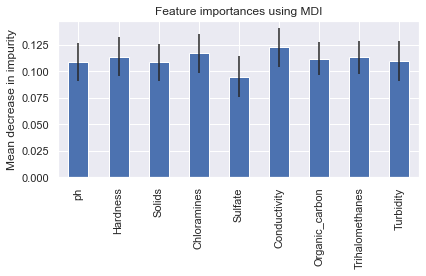

In [186]:
feature_names = ["ph", "Hardness", "Solids", "Chloramines", "Sulfate", "Conductivity","Organic_carbon", "Trihalomethanes", "Turbidity"]
forest = RandomForestClassifier(random_state=0)
forest.fit(predictors, potability)

forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()


import pandas as pd

forest_importances = pd.Series(importances, index=feature_names)




From the graph, it is difficult to find the more important predictors because all the variables have very similar height. Hence, we need to use another method which is based on feature permutation.

## Feature importance based on feature permutation

Permutation feature importance is better since it does not have a bias toward high-cardinality features and can be computed on a left-out test set.

In [192]:
from sklearn.inspection import permutation_importance

start_time = time.time()
result = permutation_importance(
    rf, predictors_test, potability_test, n_repeats=100, random_state=42, n_jobs=2
)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

forest_importances = pd.Series(result.importances_mean, index=feature_names)

Elapsed time to compute the importances: 14.202 seconds


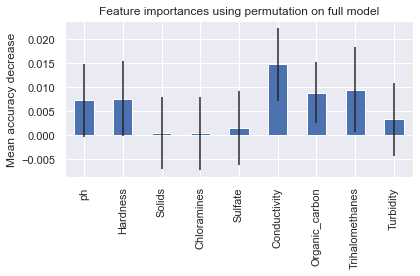

In [193]:
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

Negative mean accuracy decrease indicates that these variables are not important in predicting potability. The higher the graph, the more important the variables are to the potability.
### Important Features: ph, Hardness, Conductivity, organic_carbon and Trihalomethanes
Permutation alters everytime it runs, hence, the variables importance is not always the same everytime we run it.<br>
However, the model accuracy change is very minor with the different important variables considered after multiple permutations.

## <div class="alert alert-block alert-warning"><font color='black'><center>Random Forest Classification with important features</font></div>

In [206]:
# Extracting Important Features from data
important_predictors = pd.DataFrame(waterdata[["ph", "Hardness", "Conductivity", "Organic_carbon", "Trihalomethanes"]])

In [207]:
# Split the Dataset into Train and Test
important_predictors_train, important_predictors_test = train_test_split(important_predictors, test_size = 0.25, random_state = random_seed)

# Check the sample sizes
print("Train Set :", potability_train.shape, important_predictors_train.shape)
print("Test Set  :", potability_test.shape, important_predictors_test.shape)

Train Set : (2457, 1) (2457, 5)
Test Set  : (819, 1) (819, 5)


In [221]:
important_predictors, potability = make_classification(n_samples=1000, n_features=4, n_informative=2, n_redundant=0, 
                                             random_state=0, shuffle=False)
clf = RandomForestClassifier(max_depth=2, random_state=0)
clf.fit(important_predictors, potability)

RandomForestClassifier(...)
print(clf.predict([[0, 0, 0, 0]]))

[1]


In [222]:
rf_imp = RandomForestClassifier()
rf_imp.fit(important_predictors_train, potability_train)

RandomForestClassifier()

In [223]:
potability_pred = rf_imp.predict(important_predictors_test)

#### Model Accuracy on Test Data with Important Features

In [224]:
print(rf_imp.score(important_predictors_test, potability_test))

0.6019536019536019


The accuracy of the model is higher by 0.0085 by considering only the important features used to make prediction.

## <div class="alert alert-block alert-warning"><font color='black'><center>Tuning the Random Forest Classification</font></div>

A random grid search is performed to find the optimal parameters to produce the random forest model with the highest accuracy.<br> Default number of decision trees in a random forest is 100. <br>A random grid search is used to reduce the run time of the program.

In [201]:
# Number of trees in random forest
n_estimators = np.linspace(100, 3000, int((3000-100)/200) + 1, dtype=int)

# Number of features to consider at every split
max_features = ['auto', 'sqrt']

# Maximum number of levels in tree
max_depth = [1, 5, 10, 20, 50, 75, 100, 150, 200]

# Minimum number of samples required to split a node
# min_samples_split = [int(x) for x in np.linspace(start = 2, stop = 10, num = 9)]
min_samples_split = [1, 2, 5, 10, 15, 20, 30]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 3, 4]

# Method of selecting samples for training each tree
bootstrap = [True, False]

# Criterion
criterion=['gini', 'entropy']

random_grid = {'n_estimators': n_estimators,
#              'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap,
               'criterion': criterion}

### Random Forest Classifier with all variables

In [202]:
rf_base = RandomForestClassifier()
rf_random = RandomizedSearchCV(estimator = rf_base, param_distributions = random_grid, n_iter = 30, 
                               cv = 5, verbose=2, random_state=42, n_jobs = 4)
rf_random.fit(predictors_train, potability_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_iter=30,
                   n_jobs=4,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [1, 5, 10, 20, 50, 75, 100,
                                                      150, 200],
                                        'min_samples_leaf': [1, 2, 3, 4],
                                        'min_samples_split': [1, 2, 5, 10, 15,
                                                              20, 30],
                                        'n_estimators': array([ 100,  307,  514,  721,  928, 1135, 1342, 1550, 1757, 1964, 2171,
       2378, 2585, 2792, 3000])},
                   random_state=42, verbose=2)

#### Model Accuracy on Test Data

In [203]:
print(rf_random.score(predictors_test, potability_test))

0.608058608058608


### Random Forest Classifier with the important variables

In [204]:
rf_imp_base = RandomForestClassifier()
rf_imp_random = RandomizedSearchCV(estimator = rf_imp_base, param_distributions = random_grid, n_iter = 30, 
                               cv = 5, verbose=2, random_state=42, n_jobs = 4)
rf_imp_random.fit(important_predictors_train, potability_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_iter=30,
                   n_jobs=4,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [1, 5, 10, 20, 50, 75, 100,
                                                      150, 200],
                                        'min_samples_leaf': [1, 2, 3, 4],
                                        'min_samples_split': [1, 2, 5, 10, 15,
                                                              20, 30],
                                        'n_estimators': array([ 100,  307,  514,  721,  928, 1135, 1342, 1550, 1757, 1964, 2171,
       2378, 2585, 2792, 3000])},
                   random_state=42, verbose=2)

In [205]:
print(rf_imp_random.score(important_predictors_test, potability_test))

0.6092796092796092


#### There is a very small difference in accuracy between the two tuned random forests, so both models with different number of features can be used to predict potability.

# <div class="alert alert-block alert-info"><font color='black'><center>Conclusion</font></div>

#### Among the water variables, there little to no relationship with each other indicated by the low correlation.
#### Models can only predict potability with accuracy of up to 60%. Random Forest Classifier which went through hyperparameter tuning is the best model to predict Potability given our dataset.
#### Water companies cannot focus on only one variable, but at least five crucial variables: ph, Hardness, Conductivity, Organic carbon and Trihalomethanes can be used to predict potability. Therefore, not all variables of water are needed to be known to determine if it is drinkable.
#### From the moderately low accuracy, we can infer that there are other factors in play apart from the water variables stated in this dataset to determine whether a water source is safe to drink.

# <div class="alert alert-block alert-info"><font color='black'><center>References</font></div>

Kadiwal, A. (2020). _Water Quality_. https://www.kaggle.com/datasets/adityakadiwal/water-potability

United Nations. (2018). _Goal 6: Ensure access to water and sanitation for all_. https://www.un.org/sustainabledevelopment/water-and-sanitation/

Ritchie, H & Roser, M. (2021, June). _Clean Water_. https://ourworldindata.org/water-access

Jay. (2021). _Water Quality: Analysis (Plotly) and Modelling._ https://www.kaggle.com/code/jaykumar1607/water-quality-analysis-plotly-and-modellin

Maiti, R. (2017) _Determining the best classifier for predicting the value of a Boolean field on a blood donor database._ https://arxiv.org/ftp/arxiv/papers/1802/1802.07756.pdf

Verma, Y. (2022, May). _How to improve the accuracy of a classification model?_. https://analyticsindiamag.com/how-to-improve-the-accuracy-of-a-classification-model/

Molina, E. (2021, February). _A Practical Guide to Implementing a Random Forest Classifier in Python._ https://towardsdatascience.com/a-practical-guide-to-implementing-a-random-forest-classifier-in-python-979988d8a263

Koehrsen, W. (2017, December). _Random Forest in Python._ https://towardsdatascience.com/random-forest-in-python-24d0893d51c0

Stojiljković, M. (ND). _Split Your Dataset With scikit-learn's train_test_split()_. https://realpython.com/train-test-split-python-data/

scikit-learn. (ND). _Feature Importances with a forest of trees_. https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html

Brownlee, J. (2020, March). _How to Calculate Feature Importance with Python_. https://machinelearningmastery.com/calculate-feature-importance-with-python/